In [1]:
import tensorflow as tf
import os
import numpy as np
import matplotlib.pyplot as plt
import time
import cv2
from tensorflow.keras import layers
from keras.models import Model, Sequential
from tensorflow.keras.applications import VGG19
from keras.layers import Dense, Conv2D, Flatten, BatchNormalization, LeakyReLU
from keras.layers import Conv2DTranspose, Dropout, ReLU, Input, Concatenate, ZeroPadding2D
from keras.optimizers import Adam
from keras.utils import plot_model
# from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow_addons as tfa

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [2]:
import tensorflow as tf

physical_devices = tf.config.list_physical_devices('GPU')
if len(physical_devices) == 0:
    print("No GPU devices found. Make sure your GPU is properly installed and configured.")
else:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
    print("GPU configured successfully.")

GPU configured successfully.


In [3]:
import tensorflow as tf

# Check available GPUs
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    # Restrict TensorFlow to only allocate GPU memory growth
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
        print("GPU memory growth set to True")
    except RuntimeError as e:
        print(e)

GPU memory growth set to True


In [4]:
import tensorflow as tf

# Check if TensorFlow can access GPU
num_gpus = len(tf.config.experimental.list_physical_devices('GPU'))

if num_gpus > 0:
    print("Num GPUs Available: ", num_gpus)
    print("TensorFlow is using GPU.")
else:
    print("No GPU available. TensorFlow is using CPU.")

Num GPUs Available:  1
TensorFlow is using GPU.


In [5]:
def load(image_file):
    image = tf.io.read_file(image_file)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.cast(image,tf.float32)
    return image

In [6]:
path = "/kaggle/input/monumentimagenotaugmented"
x = load(os.path.join(path, 'train/monumentimage_10000.jpg'))
print(x.shape)

(1365, 2048, 3)


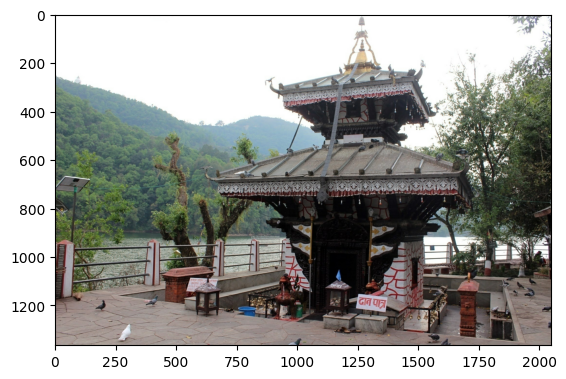

In [7]:
plt.imshow(x/255.0)

In [8]:
def normalize(real_image):
    real_image = (real_image / 255)
    return real_image

In [9]:
def random_crop(real_image):
    cropped_image = tf.image.random_crop(real_image, size = [256, 256, 3])
    return cropped_image

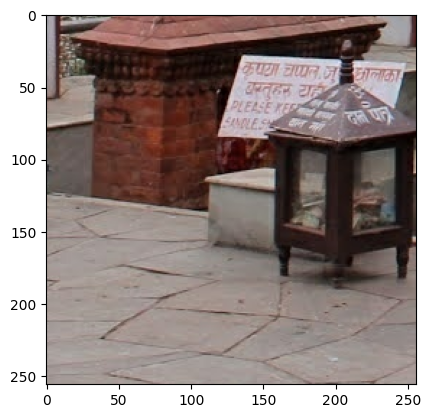

In [10]:
x_aug = random_crop(x)
plt.imshow(x_aug/255.0)

In [11]:
def resize(real_image):
    real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    return real_image

In [12]:
def rotate_image(image, angles, interpolation='BILINEAR'):
    """
    Rotate an image tensor by specified angles.

    Args:
    - image: Input image tensor with shape (batch_size, height, width, channels).
    - angles: Tensor of rotation angles in radians for each image in the batch.
    - interpolation: Interpolation method ('BILINEAR' or 'NEAREST').

    Returns:
    - Rotated image tensor.
    """
    batch_size, height, width, channels = tf.unstack(tf.shape(image))

    # Coordinates of the center of the image
    center_x = tf.cast(width, tf.float32) / 2.0
    center_y = tf.cast(height, tf.float32) / 2.0

    # Define transformation matrix
    rotation_matrix = tf.reshape(tf.stack([tf.cos(angles), -tf.sin(angles), center_x * (1 - tf.cos(angles)) + center_y * tf.sin(angles),
                                           tf.sin(angles), tf.cos(angles), -center_x * tf.sin(angles) + center_y * (1 - tf.cos(angles)),
                                           0.0, 0.0, 1.0], axis=1), shape=(-1, 3, 3))

    # Apply rotation to each pixel
    rotated_image = tfa.image.transform(image, rotation_matrix, interpolation)

    return rotated_image


In [13]:
def random_jitter(real_image):
    if tf.random.uniform(()) > 0.5:
        real_image = tf.image.flip_left_right(real_image)
    return real_image

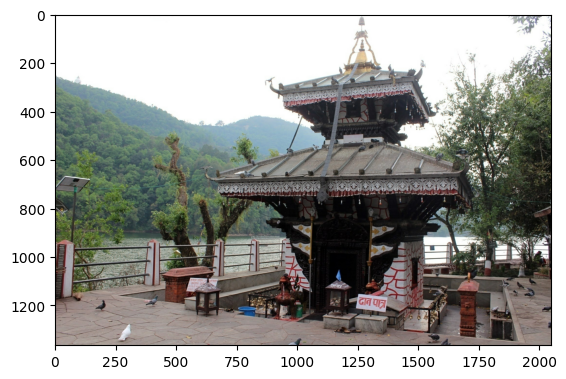

In [14]:
x_jitter = random_jitter(x)
plt.imshow(x_jitter/255.0)

In [15]:
def resize_with_aspect_ratio(image, constant_size):
        # Get image dimensions
        height, width = tf.shape(image)[0], tf.shape(image)[1]

        # Calculate aspect ratio
        aspect_ratio = tf.cast(width, tf.float32) / tf.cast(height, tf.float32)

        # Determine new dimensions based on constant size
        new_height = tf.cond(aspect_ratio >= 1.0,
                             lambda: constant_size,
                             lambda: tf.cast(constant_size / aspect_ratio, tf.int32))
        new_width = tf.cond(aspect_ratio >= 1.0,
                            lambda: tf.cast(constant_size * aspect_ratio, tf.int32),
                            lambda: constant_size)

        # Resize the image
        resized_image = tf.image.resize(image, [new_height, new_width])

        return resized_image

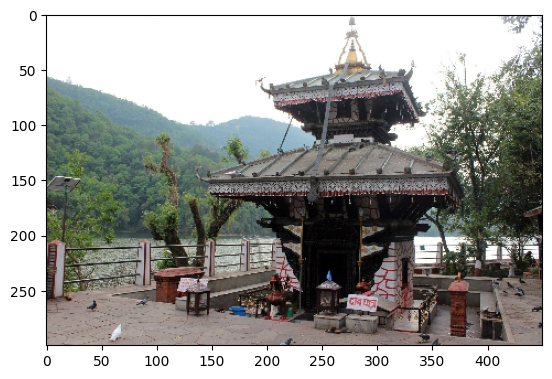

In [16]:
plt.imshow(resize_with_aspect_ratio(x,300)/255)

In [17]:
def load_train_images(image_path):
    real_image = load(image_path)
    real_image = resize_with_aspect_ratio(real_image, 500)
#     real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    real_image = tf.image.random_brightness(real_image, 0.2)
    real_image = random_crop(real_image)
    # Define the rotation angle in radians
    rotation_angle = tf.constant(20.0 * (3.141592653589793 / 180.0), dtype=tf.float32)

    # Apply the rotation using tfa.image.rotate
    real_image = tfa.image.rotate(real_image, angles=rotation_angle)

#     # Example usage
#     angles = tf.placeholder(dtype=tf.float32, shape=(None,))
#     # Specify the rotation range in degrees
#     rotation_range = 15  # Adjust this value as needed
#     # Convert the rotation range to radians
#     rotation_range_rad = rotation_range * (np.pi / 180.0)
#     # Generate random rotation angles for each image in the batch
#     random_angles = tf.random.uniform(shape=(tf.shape(image)[0],), minval=-rotation_range_rad, maxval=rotation_range_rad)
#     # Apply custom rotation to the image with bilinear interpolation
#     real_image = rotate_image(real_image, random_angles, interpolation='BILINEAR')
    #     real_image = rotate(real_image)
    real_image = random_jitter(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [18]:
def load_test_image(image_path):
    real_image = load(image_path)
    real_image = resize_with_aspect_ratio(real_image, 256)
#     real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
#     real_image = tf.image.random_brightness(real_image, 0.2)
    real_image = random_crop(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [19]:
IMAGE_SIZE = 256
BATCH_SIZE = 16

In [20]:
# create input pipeline
train_dataset = tf.data.Dataset.list_files(path + "/train/*")
train_dataset = train_dataset.map(load_train_images)
train_dataset = train_dataset.shuffle(10).batch(BATCH_SIZE)
train_dataset

<_BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 1), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 2), dtype=tf.float32, name=None))>

In [21]:
validation_dataset = tf.data.Dataset.list_files(path + '/val/*')
validation_dataset = validation_dataset.map(load_test_image)
validation_dataset = validation_dataset.batch(BATCH_SIZE)
validation_dataset

<_BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 1), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 2), dtype=tf.float32, name=None))>

In [22]:
# test_dataset = tf.data.Dataset.list_files(path + 'test/*.jpg')
# test_dataset = test_dataset.map(load_test_image)
# test_dataset = test_dataset.batch(1)
# test_dataset

In [23]:
# downsample block
def downsample(filters, size,dropout=False, batchnorm = True):
    init = tf.random_normal_initializer(0.,0.02)
    result = Sequential()
    result.add(Conv2D(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    if batchnorm == True:
        result.add(BatchNormalization())
    if dropout == True :
        result.add(Dropout(0.3))
    result.add(LeakyReLU())
    return result
down_model = downsample(3,4)
down_result = down_model(tf.expand_dims(x, axis = 0))
print(down_result.shape)

(1, 683, 1024, 3)


In [24]:
# upsample block
def upsample(filters, size, dropout = False):
    init = tf.random_normal_initializer(0, 0.02)
    result = Sequential()
    result.add(Conv2DTranspose(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    result.add(BatchNormalization())
    if dropout == True:
        result.add(Dropout(0.3))
    result.add(ReLU())
    return result
up_model = upsample(3,4)
up_result = up_model(down_result)
print(up_result.shape)

(1, 1366, 2048, 3)


In [25]:
def generator(input_shape = (256,256,1), output_channels = 2):
    inputs = Input(shape = input_shape)
    down_stack = [
        downsample(32, 4, batchnorm=False),
        downsample(64, 4),
        downsample(128, 4),
        downsample(256, 4, dropout = True),
        downsample(512, 4, dropout = True)
    ]


    up_stack = [
        upsample(512, 4, dropout=True),
        upsample(256, 4, dropout=True),
        upsample(128, 4, dropout=True),
        upsample(64, 4),
        upsample(32, 4),
    ]
    init = tf.random_normal_initializer(0., 0.02)
    last = Conv2DTranspose(2, 4, strides = 2, padding = "same", kernel_initializer = init, activation ="tanh")
    x = inputs
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    skips = reversed(skips[:-1])

    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = Concatenate()([x, skip])

    x = last(x)
    return Model(inputs = inputs, outputs = x)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 sequential_2 (Sequential)   (None, 128, 128, 32)         512       ['input_1[0][0]']             
                                                                                                  
 sequential_3 (Sequential)   (None, 64, 64, 64)           33024     ['sequential_2[0][0]']        
                                                                                                  
 sequential_4 (Sequential)   (None, 32, 32, 128)          131584    ['sequential_3[0][0]']        
                                                                                              

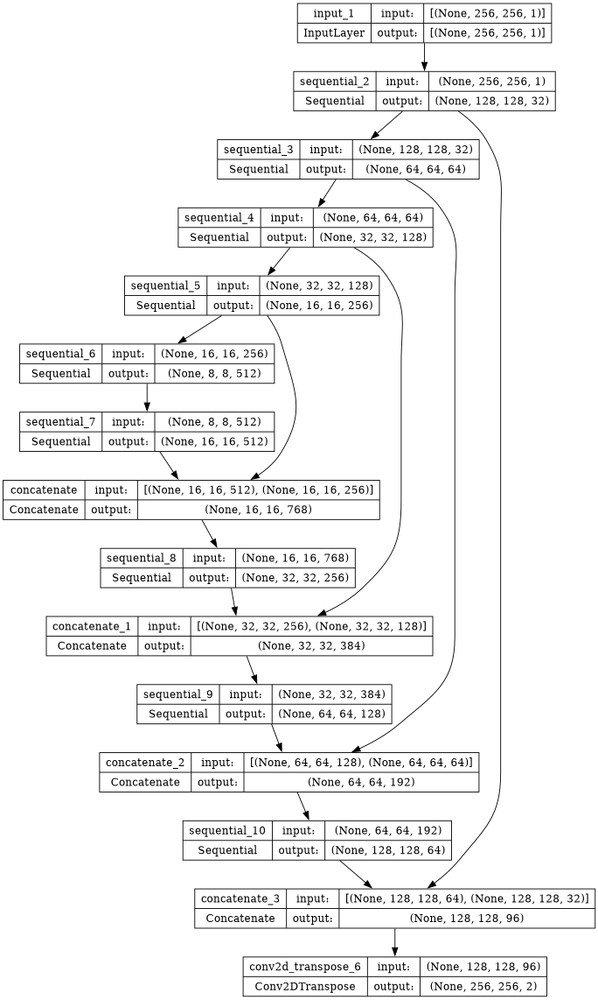

In [26]:
gen = generator()
gen.summary()
plot_model(gen, show_shapes=True, dpi = 64)

In [27]:
gen.load_weights('/kaggle/input/feb27-additional-train/modelsFeb27/gen_weight.keras')

In [28]:
def discriminator():
    init = tf.random_normal_initializer(0., 0.02)

    inp = Input(shape = [IMAGE_SIZE, IMAGE_SIZE, 1], name = "input_image")
    tar = Input(shape = [IMAGE_SIZE, IMAGE_SIZE, 2], name = "target_image")
    x = Concatenate()([inp, tar])
    down1 = downsample(64,4,False)(x)
    down2 = downsample(128, 4)(down1)
    down3 = downsample(256, 4)(down2)

    zero_pad1 = ZeroPadding2D()(down3)
    conv = Conv2D(256, 4, strides = 1, kernel_initializer = init, use_bias = False)(zero_pad1)
    leaky_relu = LeakyReLU()(conv)
    zero_pad2 = ZeroPadding2D()(leaky_relu)
    last = Conv2D(1, 4, strides = 1, kernel_initializer=init)(zero_pad2)
    return Model(inputs = [inp, tar], outputs = last)

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_image (InputLayer)    [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 target_image (InputLayer)   [(None, 256, 256, 2)]        0         []                            
                                                                                                  
 concatenate_4 (Concatenate  (None, 256, 256, 3)          0         ['input_image[0][0]',         
 )                                                                   'target_image[0][0]']        
                                                                                                  
 sequential_12 (Sequential)  (None, 128, 128, 64)         3328      ['concatenate_4[0][0]'] 

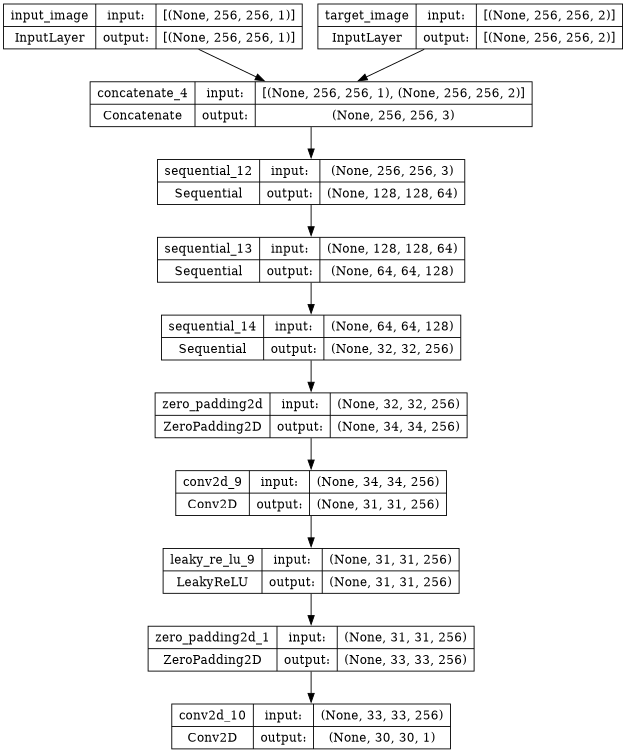

In [29]:
disc = discriminator()
disc.summary()
plot_model(disc, show_shapes=True, dpi = 64)

In [30]:
disc.load_weights('/kaggle/input/feb27-additional-train/modelsFeb27/disc_weight.keras')

In [31]:
# Function to create YUV image from Y, U, and V channels and then convert to rgb
def create_rgb_image(y_channel, uv_channel):
    # Assuming YUV format where Y, U, and V channels are separate
    # y_channel = np.array(y_channel)
    # uv_channel = np.array(uv_channel)
    u_channel, v_channel = tf.split(uv_channel, num_or_size_splits=2, axis=-1)

    # Combine Y, U, and V channels into a YUV image
    rgb_image = tf.image.yuv_to_rgb(tf.concat([y_channel, u_channel, v_channel], axis=-1))
    return rgb_image


In [32]:
LAMBDA = 140

In [33]:
# Define the perceptual loss function
def perceptual_loss(y_true, y_pred):
    vgg = VGG19(include_top=False, weights='imagenet', input_shape=(None, None, 3))
    vgg.trainable = False
    for layer in vgg.layers:
        layer.trainable = False
    model = Model(inputs=vgg.input, outputs=vgg.get_layer('block5_conv4').output)
    model.trainable = False

    y_true_features = model(y_true)
    y_pred_features = model(y_pred)

    return tf.reduce_mean(tf.square(y_true_features - y_pred_features))

In [34]:
def generator_loss(disc_generated_output,input_, gen_output, target):
    gan_loss = loss_function(tf.ones_like(disc_generated_output), disc_generated_output)
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
    p_loss = perceptual_loss(create_rgb_image(input_, gen_output), create_rgb_image(input_, target))
    total_gen_loss = gan_loss + (LAMBDA * l1_loss) + 140*p_loss
    return total_gen_loss, gan_loss, l1_loss, p_loss

In [35]:
from keras.losses import BinaryCrossentropy
loss_function = BinaryCrossentropy(from_logits=True)

In [36]:
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_function(tf.ones_like(disc_real_output), disc_real_output)
    generated_loss = loss_function(tf.zeros_like(disc_generated_output), disc_generated_output)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss, real_loss, generated_loss

In [37]:
generator_optimizer = Adam(lr= 2e-4, beta_1=0.5)
discriminator_optimizer = Adam(lr = 2e-4, beta_1=0.5)

In [38]:
epochs = 250

In [39]:
# import tensorflow as tf
# from tensorflow.keras.applications import VGG19
# from tensorflow.keras.models import Model

# # Load the VGG19 model
# vgg = VGG19(weights='imagenet', include_top=False)

# # Select the layers you want to use for the LPIPS score
# selected_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1']

# # Create a model that outputs the selected layers
# outputs = [vgg.get_layer(name).output for name in selected_layers]
# model = Model(inputs=vgg.input, outputs=outputs)

# # Make sure the VGG model is not trainable
# model.trainable = False

# def lpips_score(image1, image2):
#     # Get the features for both images
#     image1_features = model(image1)
#     image2_features = model(image2)

#     # Initialize the score
#     score = 0

#     # For each feature layer...
#     for f1, f2 in zip(image1_features, image2_features):
#         # ... compute the mean squared error between the features
#         mse = tf.reduce_mean((f1 - f2)**2)
#         # ... and add it to the score
#         score += mse

#     return score

In [40]:
# from tensorflow.keras.applications.inception_v3 import InceptionV3
# from scipy.linalg import sqrtm

# # Load the pre-trained InceptionV3 model (weights will be downloaded if not present)
# pretrained_model = InceptionV3(weights='imagenet', include_top=True, pooling='avg')

# # Optionally, you can freeze the layers to prevent training
# for layer in pretrained_model.layers:
#     layer.trainable = False


# # Create a new model to extract features from an intermediate layer
# inception_model = tf.keras.Model(inputs=pretrained_model.input, outputs=pretrained_model.get_layer('avg_pool').input)
# def calculate_fid_score(images1, images2, inception_model):
#     # Ensure the batch dimension is removed for individual image predictions
#     images1 = np.squeeze(images1, axis=0)
#     images2 = np.squeeze(images2, axis=0)
    
#     # Resize images to the required size for the Inception model
#     images1 = tf.image.resize(images1, size=(299, 299))
#     images2 = tf.image.resize(images2, size=(299, 299))
    
#     # Extract features using the Inception model
#     features1 = inception_model.predict(np.expand_dims(images1, axis=0))
#     features2 = inception_model.predict(np.expand_dims(images2, axis=0))

#     # Remove batch dimension from features
#     features1 = np.squeeze(features1, axis=0)
#     features2 = np.squeeze(features2, axis=0)
#     #print(features1.shape)
#     # Calculate mean and covariance of feature representations
#     mean1 = np.mean(features1, axis=(0, 1, 2))
#     mean2 = np.mean(features2, axis=(0, 1, 2))
#     #print(features1.shape)
#     cov1 = np.cov(features1.transpose(2, 0, 1).reshape(features1.shape[-1], -1), rowvar=False)
#     cov2 = np.cov(features2.transpose(2, 0, 1).reshape(features2.shape[-1], -1), rowvar=False)
#     #print(cov2.shape)

#     # Calculate the squared Euclidean distance between means
#     sum_squared_diff = np.sum((mean1 - mean2)**2)

#     # Calculate the trace of the product of covariances
#     cov_sqrt = sqrtm(np.dot(cov1, cov2))
#     trace_cov_product = np.trace(cov1 + cov2 - 2 * cov_sqrt)

#     # Calculate FID score
#     fid_score = np.real(sum_squared_diff + trace_cov_product)
    
#     return fid_score

In [41]:
@tf.function
def train_step(input_image, target, epoch, training_discriminator):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = gen(input_image, training=True)
        disc_real_output = disc([input_image, target], training=True)
        disc_generated_output = disc([input_image, gen_output], training=True)
        gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
        disc_loss, disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
        rgb_target = create_rgb_image(input_image, target)
        rgb_generated = create_rgb_image(input_image, gen_output)
        ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
        psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#         lpips_values = lpips_score(rgb_target, rgb_generated)

        if epoch > 8:
            if training_discriminator:
                discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
                discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))
            else:
                generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
                generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
        else:
            generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
            discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
            generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
            discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))

        return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss,ssim_values, psnr_values, tf.constant([0])

In [42]:
@tf.function
def validation_step(input_image, target):
    # Generate output using the generator
    gen_output = gen(input_image)

    # Calculate losses without updating gradients
    disc_real_output = disc([input_image, target])
    disc_generated_output = disc([input_image, gen_output])

    gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
    disc_loss,disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
    rgb_target = create_rgb_image(input_image, target)
    rgb_generated = create_rgb_image(input_image, gen_output)
    ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
    psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#     lpips_values = lpips_score(rgb_target, rgb_generated)
    #accuracy = calculate_accuracy(disc_generated_output, disc_real_output)
    return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, tf.constant([0])

In [43]:
# @tf.function
# def test_step(input_image, target):
#     # Generate output using the generator
#     gen_output = gen(input_image)

#     # Calculate losses without updating gradients
#     disc_real_output = disc([input_image, target])
#     disc_generated_output = disc([input_image, gen_output])

#     gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
#     disc_loss,disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
#     rgb_target = create_rgb_image(input_image, target)
#     rgb_generated = create_rgb_image(input_image, gen_output)
#     ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
#     psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#     lpips_values = lpips_score(rgb_target, rgb_generated)
#     fid_values = calculate_fid_score(rgb_target, rgb_generated, inception_model)
#     #accuracy = calculate_accuracy(disc_generated_output, disc_real_output)
#     return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, lpips_values, fid_values


In [44]:
os.mkdir('/kaggle/working/gen_output/')

In [45]:
def display_one_random_test_image(input_, target, gen_model, epoch):
    print("Displaying one random test image...")
    img_array = np.array(input_)
    generated_output_test = gen_model(input_)
    ssim = tf.image.ssim(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)
    psnr = tf.image.psnr(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)  
#     lpips = lpips_score(tf.reshape(create_rgb_image(input_, target), (1,256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (1,256,256,3)))
#     p_loss = perceptual_loss(create_rgb_image(input_, target), create_rgb_image(input_, generated_output_test))
#     fid_score = calculate_fid_score(tf.reshape(create_rgb_image(input_, target), (1,256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (1,256,256,3)), inception_model)
    # print(input_.shape)
    input_ = np.squeeze(input_, axis=0)
    # print(type(input_), type(target))
    # print(input_.shape, input_)
    # input_.reshape((256,256))
    plt.figure(figsize=(16, 16))
    plt.subplot(1, 4, 1)
    plt.title('Input Testing Image')
    plt.imshow(input_, cmap='gray', vmax = 1, vmin = 0)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # print(target.shape)
    target = np.squeeze(target, axis=0)
    # # print(target.shape)
    target_img = create_rgb_image(input_, target).numpy()
    # # print(type(target_img))
    # target
    # # print(target_img.shape, target_img)
    plt.subplot(1, 4, 2)
    plt.title('Target Testing Image')
    plt.imshow(target_img)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # Convert PIL Image to NumPy array
    # img_array = np.array(input_)
    # # Add batch dimension
    # # print(img_array.shape)
    # img_array = np.expand_dims(img_array, axis=0)
    # # print(img_array.shape)
    # generated_output_test = gen_model(img_array)
    # # print(generated_output_test.shape)
    # # Squeeze the singleton dimension
    generated_output_test = np.squeeze(generated_output_test, axis=0)
    # # print(generated_output_test.shape)
    generated_img = create_rgb_image(input_, generated_output_test).numpy()
    # # print(generated_img.shape, generated_img)
    plt.subplot(1, 4, 3)
    plt.title(f'Generated Output -- epoch {epoch}')
    plt.imshow(generated_img)  # Assuming images are normalized to [-1, 1]
    plt.axis('off')
    plt.savefig(f'/kaggle/working/gen_output/epoch_{epoch}.png')
    plt.show()
    print('SSIM Score: {}'.format(ssim))
    print('PSNR Score: {}'.format(psnr))
#     print('LPIPS Score: {}'.format(lpips))
#     print('Perceptual Loss: {}'.format(p_loss))
#     print('FID Score: {}'.format(fid_score))

In [46]:
def display_random_test_image(gen_model, image_path, epoch):
    
    real_image = load(image_path)
    real_image = resize(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:] 

    # Display the image
    display_one_random_test_image(tf.reshape(Y_channel, (1,256,256,1)),tf.reshape(UV_channels,(1,256,256,2)), gen_model, epoch)


Displaying one random test image...


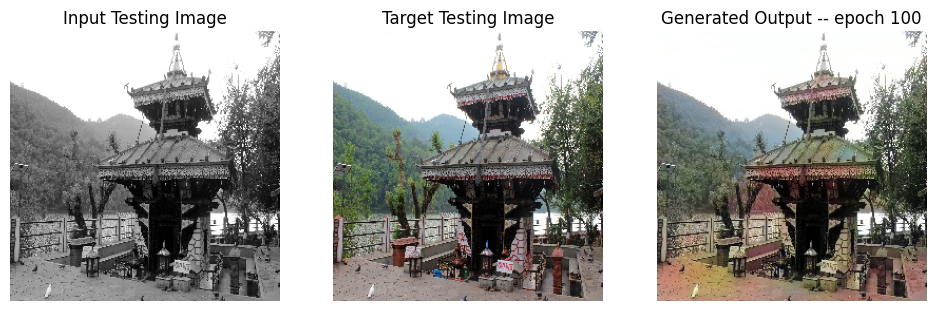

SSIM Score: 0.9712817072868347
PSNR Score: 27.330799102783203


In [47]:
display_random_test_image(gen, '/kaggle/input/monumentimagenotaugmented/train/monumentimage_10000.jpg',100)

In [48]:
import random

each_epoch_train_generator_losses = []
each_epoch_train_generator_gan_losses = []
each_epoch_train_generator_l1_losses = []
each_epoch_train_generator_l2_losses = []
each_epoch_train_generator_perceptual_losses = []
each_epoch_train_discriminator_losses = []
each_epoch_train_discriminator_real_losses = []
each_epoch_train_discriminator_generated_losses = []
each_epoch_train_ssim = []
each_epoch_train_psnr = []
each_epoch_train_lpips = []
each_epoch_test_lpips = []
each_epoch_test_psnr = []
each_epoch_test_ssim = []
each_epoch_test_generator_losses = []
each_epoch_test_generator_gan_losses = []
each_epoch_test_generator_l1_losses = []
each_epoch_test_generator_l2_losses = []
each_epoch_test_generator_perceptual_losses = []
each_epoch_test_discriminator_losses = []
each_epoch_test_discriminator_real_losses = []
each_epoch_test_discriminator_generated_losses = []
train_generator_losses = []
train_generator_gan_losses = []
train_generator_l1_losses = []
train_generator_l2_losses = []
train_generator_perceptual_losses = []
train_discriminator_losses = []
train_discriminator_real_losses = []
train_discriminator_generated_losses = []
test_generator_losses = []
test_generator_gan_losses = []
test_generator_l1_losses = []
test_generator_l2_losses = []
test_generator_perceptual_losses = []
test_discriminator_losses = []
test_discriminator_real_losses = []
test_discriminator_generated_losses =[]
training_ssim = []
training_psnr = []
training_lpips = []
testing_ssim = []
testing_psnr = []
testing_lpips = []
each_epoch_all_records = []
all_records = []
def fit(train_ds, epochs, test_ds, gen_model):

    # Declare global lists
    global each_epoch_train_generator_losses, each_epoch_train_generator_gan_losses, each_epoch_train_generator_l1_losses, each_epoch_train_generator_l2_losses, each_epoch_train_generator_perceptual_losses, each_epoch_train_discriminator_losses,each_epoch_train_discriminator_real_losses, each_epoch_train_discriminator_generated_losses, each_epoch_train_ssim, each_epoch_train_psnr
    global each_epoch_test_psnr, each_epoch_test_ssim, each_epoch_test_generator_losses, each_epoch_test_generator_gan_losses, each_epoch_test_generator_l1_losses, each_epoch_test_generator_l2_losses, each_epoch_test_generator_perceptual_losses, each_epoch_test_discriminator_losses, each_epoch_test_discriminator_real_losses, each_epoch_test_discriminator_generated_losses
    global train_generator_losses, train_generator_gan_losses, train_generator_l1_losses, train_generator_l2_losses, train_generator_perceptual_losses, train_discriminator_losses, train_discriminator_real_losses, train_discriminator_generated_losses, test_generator_losses, test_generator_l2_losses, test_generator_gan_losses, test_generator_l1_losses, test_generator_perceptual_losses, test_discriminator_losses, test_discriminator_real_losses, test_discriminator_generated_losses
    global training_ssim, training_psnr, testing_ssim, testing_psnr, each_epoch_all_records, all_records, LAMBDA, each_epoch_train_lpips, each_epoch_test_lpips, training_lpips, testing_lpips


    # Initialize counters and flags
    consecutive_epochs_high_loss = 0
    training_discriminator = True
    stop_training = False
    min_learning_rate = 1e-7  # Set your desired minimum learning rate
    time_start = time.time()
    
    for ep in range(epochs):
        epoch = ep 
        start = time.time()
        train_count = 0
        test_count = 0

        print(f"Epoch {epoch}")

        for n, (input_, target) in train_ds.enumerate():
            if epoch > 10:
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss,train_gen_perceptual_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr, train_lpips = train_step(input_, target, epoch, training_discriminator=training_discriminator)

            else:
                # If epoch is less than or equal to 10, train both generator and discriminator
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss, train_gen_perceptual_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr, train_lpips  = train_step(input_, target, epoch, training_discriminator=None)

            each_epoch_train_generator_losses.append(train_gen_loss)
            each_epoch_train_generator_gan_losses.append(train_gen_gan_loss)
            each_epoch_train_generator_l1_losses.append(train_gen_l1_loss)
#             each_epoch_train_generator_l2_losses.append(train_gen_l2_loss)
            each_epoch_train_generator_perceptual_losses.append(train_gen_perceptual_loss)
            each_epoch_train_discriminator_losses.append(train_disc_loss)
            each_epoch_train_discriminator_real_losses.append(train_disc_real_loss)
            each_epoch_train_discriminator_generated_losses.append(train_disc_generated_loss)
            each_epoch_train_ssim.append(tf.reduce_mean(train_ssim.numpy()))
            each_epoch_train_psnr.append(tf.reduce_mean(train_psnr.numpy()))
            each_epoch_train_lpips.append(tf.reduce_mean(train_lpips.numpy()))
#             print(train_count)
            train_count += 1
#             print(n)
        #each_epoch_train_generator_losses = np.array(each_epoch_train_generator_losses)
        #print(each_epoch_train_discriminator_losses.shape())
        #print(each_epoch_train_generator_losses.shape())
        #print(each_epoch_train_ssim())
        print("Training Details")
        print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f} perceptual_loss:{:.5f} Discriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- SSIM {:.5f} PSNR {:.5f} LPIPS {:.5f}".format(np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses),np.mean(each_epoch_train_generator_perceptual_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr), np.mean(each_epoch_train_lpips)))
        print("Time taken for epoch {} is {} sec".format(epoch + 1, time.time() - start))
        print(f"Number of iteration {train_count}")

        train_generator_losses.append(np.mean(each_epoch_train_generator_losses))
        train_generator_gan_losses.append(np.mean(each_epoch_train_generator_gan_losses))
        train_generator_l1_losses.append(np.mean(each_epoch_train_generator_l1_losses))
#         train_generator_l2_losses.append(np.mean(each_epoch_train_generator_l2_losses))
        train_generator_perceptual_losses.append(np.mean(each_epoch_train_generator_perceptual_losses))
        train_discriminator_losses.append(np.mean(each_epoch_train_discriminator_losses))
        train_discriminator_real_losses.append(np.mean(each_epoch_train_discriminator_real_losses))
        train_discriminator_generated_losses.append(np.mean(each_epoch_train_discriminator_generated_losses))
        training_ssim.append(np.mean(each_epoch_train_ssim))
        training_psnr.append(np.mean(each_epoch_train_psnr))
        training_lpips.append(np.mean(each_epoch_train_lpips))

        # Test
        for n, (input_, target) in test_ds.enumerate():
            test_gen_loss, test_gen_gan_loss, test_gen_l1_loss, test_gen_perceptual_loss, test_disc_loss, test_disc_real_loss, test_disc_generated_loss, test_ssim, test_psnr, test_lpips = validation_step(input_, target)
            test_count += 1

            each_epoch_test_generator_losses.append(test_gen_loss)
            each_epoch_test_generator_gan_losses.append(test_gen_gan_loss)
            each_epoch_test_generator_l1_losses.append(test_gen_l1_loss)
#             each_epoch_test_generator_l2_losses.append(test_gen_l2_loss)
            each_epoch_test_generator_perceptual_losses.append(test_gen_perceptual_loss)
            each_epoch_test_discriminator_losses.append(test_disc_loss)
            each_epoch_test_discriminator_real_losses.append(test_disc_real_loss)
            each_epoch_test_discriminator_generated_losses.append(test_disc_generated_loss)
            each_epoch_test_ssim.append(tf.reduce_mean(test_ssim.numpy()))
            each_epoch_test_psnr.append(tf.reduce_mean(test_psnr.numpy()))
            each_epoch_test_lpips.append(tf.reduce_mean(test_lpips.numpy()))
    
        print("Validation Details")
        print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f}  perceptual_loss:{:.5f} Discriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- SSIM {:.5f} PSNR {:.5f} LPIPS {:.5f}".format(np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses), np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr), np.mean(each_epoch_test_lpips)))
        print("Time taken for epoch {} is {} sec".format(epoch+1, time.time() - start))
        print(f"Number of iteration {test_count}")
#         LAMBDA = LAMBDA * 1.006
        test_generator_losses.append(np.mean(each_epoch_test_generator_losses))
        test_generator_gan_losses.append(np.mean(each_epoch_test_generator_gan_losses))
        test_generator_l1_losses.append(np.mean(each_epoch_test_generator_l1_losses))
#         test_generator_l2_losses.append(np.mean(each_epoch_test_generator_l2_losses))
        test_generator_perceptual_losses.append(np.mean(each_epoch_test_generator_perceptual_losses))
        test_discriminator_losses.append(np.mean(each_epoch_test_discriminator_losses))
        test_discriminator_real_losses.append(np.mean(each_epoch_test_discriminator_real_losses))
        test_discriminator_generated_losses.append(np.mean(each_epoch_test_discriminator_generated_losses))
        testing_ssim.append(np.mean(each_epoch_test_ssim))
        testing_psnr.append(np.mean(each_epoch_test_psnr))
        testing_lpips.append(np.mean(each_epoch_test_lpips))

        each_epoch_all_records.append([np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses),np.mean(each_epoch_train_generator_perceptual_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr), np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses),np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr)])
        all_records.append(each_epoch_all_records)
        # emptying for next epoch
        each_epoch_test_ssim = []
        each_epoch_test_generator_losses = []
        each_epoch_test_generator_gan_losses = []
        each_epoch_test_generator_l1_losses = []
#         each_epoch_test_generator_l2_losses = []
        each_epoch_test_generator_perceptual_losses = []
        each_epoch_test_discriminator_losses = []
        each_epoch_test_discriminator_real_losses = []
        each_epoch_test_discriminator_generated_losses = []
        each_epoch_test_psnr = []
        each_epoch_test_lpips = []
        each_epoch_all_records = []
        #emptyling list for next iteration
        each_epoch_train_generator_losses = []
        each_epoch_train_generator_gan_losses = []
        each_epoch_train_generator_l1_losses = []
#         each_epoch_train_generator_l2_losses = []
        each_epoch_train_generator_perceptual_losses = []
        each_epoch_train_discriminator_losses = []
        each_epoch_train_discriminator_real_losses = []
        each_epoch_train_discriminator_generated_losses = []
        each_epoch_train_ssim = []
        each_epoch_train_psnr = []
        each_epoch_train_lpips = []
        if time.time() - time_start > 41000:
            stop_training = True
        if epoch == 0 or epoch % 3 == 0:
            # Function to display one random test image
            # def display_random_test_image(images, labels, gen_model):
            #     # Randomly select an index
            #     random_test_image_idx = random.randint(0, len(images) - 1)

            #     # Extract input and target from the selected index
            #     random_test_input = images[random_test_image_idx]
            #     random_test_target = labels[random_test_image_idx]

            #     # Display the image
            #     display_one_random_test_image(random_test_input, random_test_target, gen_model)

            # Example usage
            display_random_test_image(gen, '/kaggle/input/monumentimagenotaugmented/val/monumentimage_10204.jpg', epoch+1)
        # Check if the difference between two consecutive epochs for the last 5 epochs is less than 1
        if ep > 10:
            # Check 1f the difference between two consecutive epochs for the last S epochs is less than 1 or 0.3
            last_epochs_losses = train_discriminator_losses[-5:] if training_discriminator else train_generator_losses[-5:]
            if all(((last_epochs_losses[i] - last_epochs_losses[i - 1])) < 0.01 if training_discriminator else ((last_epochs_losses[1] - last_epochs_losses[i - 1])) < 0.05 for i in range(1, 5)):
                consecutive_epochs_high_loss += 1
            else:
                consecutive_epochs_high_loss = 0
        
        
#         LAMBDA = LAMBDA*1.003
            # If the condition is met for 4 consecutive epochs, reduce the learning rate
        if consecutive_epochs_high_loss == 4:
            if training_discriminator:
                current_lr = generator_optimizer. learning_rate.numpy()
                new_lr = max (current_lr * 0.45, min_learning_rate)
                if new_lr > min_learning_rate:
                    generator_optimizer.learning_rate.assign(new_lr)
                    print (f"Reduced generator learning rate to {new_lr} at epoch {epoch + 1}")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Generator learning rate already at the minimum. Stopping training.")
                    stop_training = True
            else:
                current_lr = discriminator_optimizer.learning_rate.numpy()
                new_lr = max (current_lr * 0.3, min_learning_rate)
                if new_lr > min_learning_rate:
                    discriminator_optimizer.learning_rate.assign(new_lr)
                    print(f"Reduced discriminator learning rate to {new_lr} at epoch {epoch + 1}.")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Discriminator learning rate already at the minimum. Stopping training.")
                    stop_training = True

                consecutive_epochs_high_loss = 0
        # Check the flag variable
        if stop_training:
            break

In [49]:
tf.config.run_functions_eagerly(True)

Epoch 0
80134624/80134624 [==============================] - 4s 0us/step
Training Details
Generator-- total_loss:6.86155 gan_loss:0.96384 l1_loss:0.03623 perceptual_loss:0.00590 Discriminator-- total_loss:1.62922 real_loss:0.78825 generated_loss:0.84096 --- SSIM 0.94546 PSNR 24.55612 LPIPS 0.00000
Time taken for epoch 1 is 648.8767719268799 sec
Number of iteration 525
Validation Details
Generator-- total_loss:13.34862 gan_loss:0.83654 l1_loss:0.07637  perceptual_loss:0.01300 Discriminator-- total_loss:1.53649 real_loss:0.64601 generated_loss:0.89049 --- SSIM 0.86562 PSNR 18.66322 LPIPS 0.00000
Time taken for epoch 1 is 697.6148397922516 sec
Number of iteration 70
Displaying one random test image...


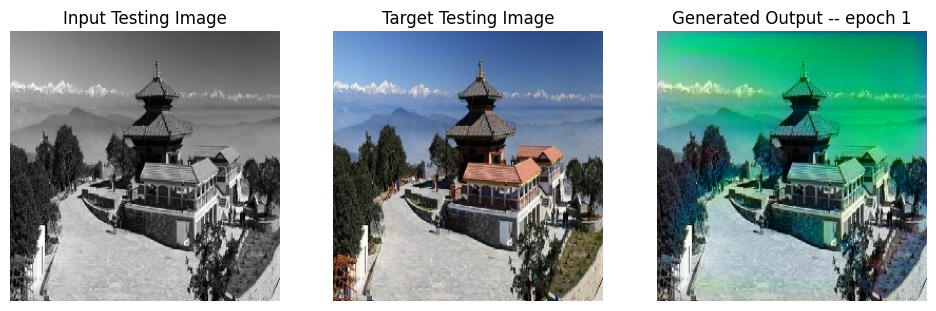

SSIM Score: 0.7521898746490479
PSNR Score: 15.385340690612793
Epoch 1
Training Details
Generator-- total_loss:6.84839 gan_loss:0.94070 l1_loss:0.03639 perceptual_loss:0.00581 Discriminator-- total_loss:1.32539 real_loss:0.64977 generated_loss:0.67562 --- SSIM 0.94451 PSNR 24.52166 LPIPS 0.00000
Time taken for epoch 2 is 657.0327911376953 sec
Number of iteration 525
Validation Details
Generator-- total_loss:16.27483 gan_loss:0.48378 l1_loss:0.09755  perceptual_loss:0.01524 Discriminator-- total_loss:1.89455 real_loss:1.33943 generated_loss:0.55512 --- SSIM 0.84399 PSNR 16.62249 LPIPS 0.00000
Time taken for epoch 2 is 704.0497074127197 sec
Number of iteration 70
Epoch 2
Training Details
Generator-- total_loss:6.86574 gan_loss:0.94060 l1_loss:0.03654 perceptual_loss:0.00579 Discriminator-- total_loss:1.29802 real_loss:0.63472 generated_loss:0.66330 --- SSIM 0.94290 PSNR 24.53558 LPIPS 0.00000
Time taken for epoch 3 is 637.4740393161774 sec
Number of iteration 525
Validation Details
Genera

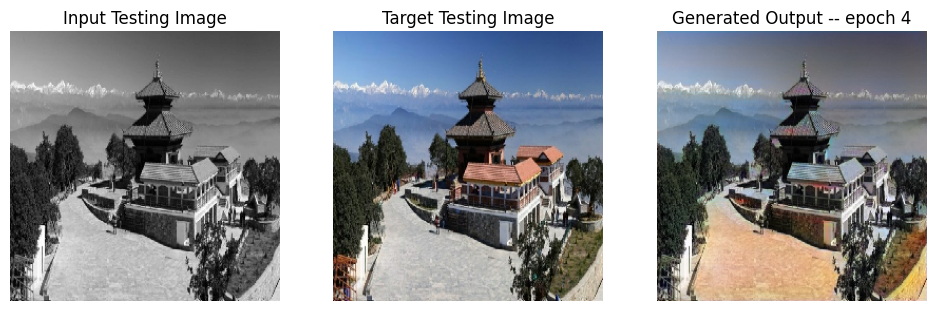

SSIM Score: 0.9587799906730652
PSNR Score: 21.652746200561523
Epoch 4
Training Details
Generator-- total_loss:6.98151 gan_loss:0.96748 l1_loss:0.03703 perceptual_loss:0.00593 Discriminator-- total_loss:1.27865 real_loss:0.62533 generated_loss:0.65332 --- SSIM 0.94095 PSNR 24.36983 LPIPS 0.00000
Time taken for epoch 5 is 641.9464974403381 sec
Number of iteration 525
Validation Details
Generator-- total_loss:8.43061 gan_loss:0.66219 l1_loss:0.04628  perceptual_loss:0.00921 Discriminator-- total_loss:1.43903 real_loss:0.80821 generated_loss:0.63082 --- SSIM 0.94048 PSNR 22.80665 LPIPS 0.00000
Time taken for epoch 5 is 688.0245471000671 sec
Number of iteration 70
Epoch 5
Training Details
Generator-- total_loss:6.98957 gan_loss:0.96760 l1_loss:0.03706 perceptual_loss:0.00596 Discriminator-- total_loss:1.26067 real_loss:0.61479 generated_loss:0.64588 --- SSIM 0.94089 PSNR 24.38344 LPIPS 0.00000
Time taken for epoch 6 is 635.7798135280609 sec
Number of iteration 525
Validation Details
Generat

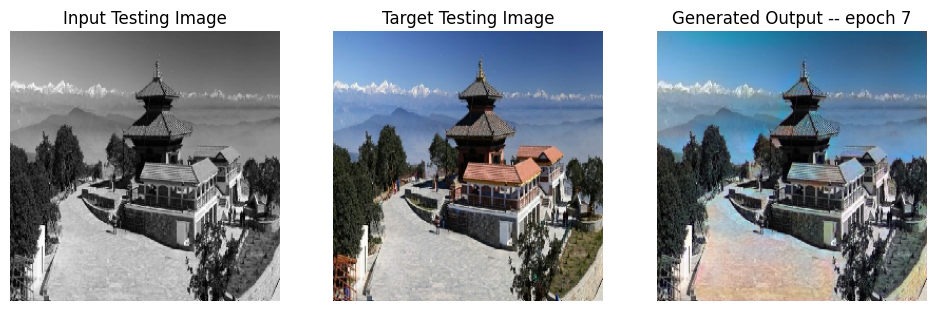

SSIM Score: 0.9539000391960144
PSNR Score: 25.034883499145508
Epoch 7
Training Details
Generator-- total_loss:6.96480 gan_loss:0.96111 l1_loss:0.03690 perceptual_loss:0.00599 Discriminator-- total_loss:1.26493 real_loss:0.61544 generated_loss:0.64949 --- SSIM 0.93974 PSNR 24.36475 LPIPS 0.00000
Time taken for epoch 8 is 636.3448832035065 sec
Number of iteration 525
Validation Details
Generator-- total_loss:7.46107 gan_loss:0.53325 l1_loss:0.04078  perceptual_loss:0.00871 Discriminator-- total_loss:1.38012 real_loss:0.96601 generated_loss:0.41411 --- SSIM 0.94382 PSNR 23.87592 LPIPS 0.00000
Time taken for epoch 8 is 683.5044031143188 sec
Number of iteration 70
Epoch 8
Training Details
Generator-- total_loss:6.99163 gan_loss:0.96445 l1_loss:0.03705 perceptual_loss:0.00600 Discriminator-- total_loss:1.26790 real_loss:0.61870 generated_loss:0.64920 --- SSIM 0.93908 PSNR 24.37255 LPIPS 0.00000
Time taken for epoch 9 is 636.3799343109131 sec
Number of iteration 525
Validation Details
Generat

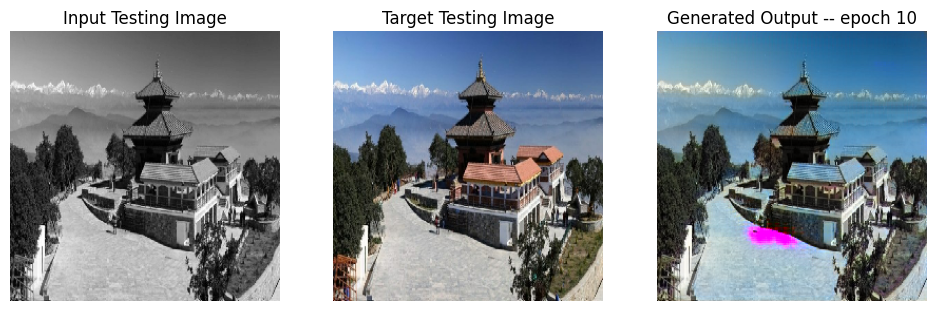

SSIM Score: 0.9416377544403076
PSNR Score: 19.305028915405273
Epoch 10
Training Details
Generator-- total_loss:5.97083 gan_loss:0.49536 l1_loss:0.03334 perceptual_loss:0.00577 Discriminator-- total_loss:1.66623 real_loss:1.06207 generated_loss:0.60417 --- SSIM 0.95255 PSNR 24.85211 LPIPS 0.00000
Time taken for epoch 11 is 573.2103004455566 sec
Number of iteration 525
Validation Details
Generator-- total_loss:9.21896 gan_loss:0.31589 l1_loss:0.05084  perceptual_loss:0.01275 Discriminator-- total_loss:1.92640 real_loss:1.42293 generated_loss:0.50346 --- SSIM 0.93638 PSNR 22.18343 LPIPS 0.00000
Time taken for epoch 11 is 619.8112456798553 sec
Number of iteration 70
Epoch 11
Training Details
Generator-- total_loss:15.23611 gan_loss:9.29314 l1_loss:0.03582 perceptual_loss:0.00663 Discriminator-- total_loss:0.01789 real_loss:0.00882 generated_loss:0.00908 --- SSIM 0.94839 PSNR 23.96835 LPIPS 0.00000
Time taken for epoch 12 is 429.81715846061707 sec
Number of iteration 525
Validation Details


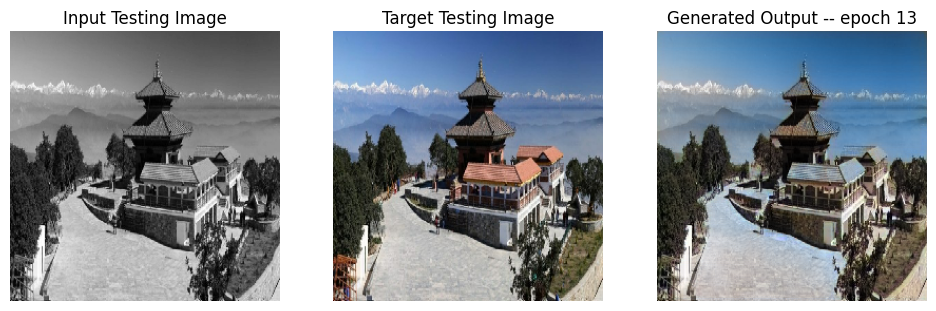

SSIM Score: 0.9694395065307617
PSNR Score: 25.987157821655273
Epoch 13
Training Details
Generator-- total_loss:15.19059 gan_loss:9.23232 l1_loss:0.03590 perceptual_loss:0.00666 Discriminator-- total_loss:0.00635 real_loss:0.00513 generated_loss:0.00122 --- SSIM 0.94823 PSNR 23.96176 LPIPS 0.00000
Time taken for epoch 14 is 431.02879071235657 sec
Number of iteration 525
Validation Details
Generator-- total_loss:7.93471 gan_loss:1.26961 l1_loss:0.03890  perceptual_loss:0.00871 Discriminator-- total_loss:1.31708 real_loss:0.72927 generated_loss:0.58781 --- SSIM 0.94800 PSNR 24.29581 LPIPS 0.00000
Time taken for epoch 14 is 478.1827142238617 sec
Number of iteration 70
Epoch 14
Training Details
Generator-- total_loss:16.90649 gan_loss:10.98615 l1_loss:0.03570 perceptual_loss:0.00659 Discriminator-- total_loss:0.00111 real_loss:0.00085 generated_loss:0.00026 --- SSIM 0.94853 PSNR 24.00070 LPIPS 0.00000
Time taken for epoch 15 is 427.2539710998535 sec
Number of iteration 525
Validation Detail

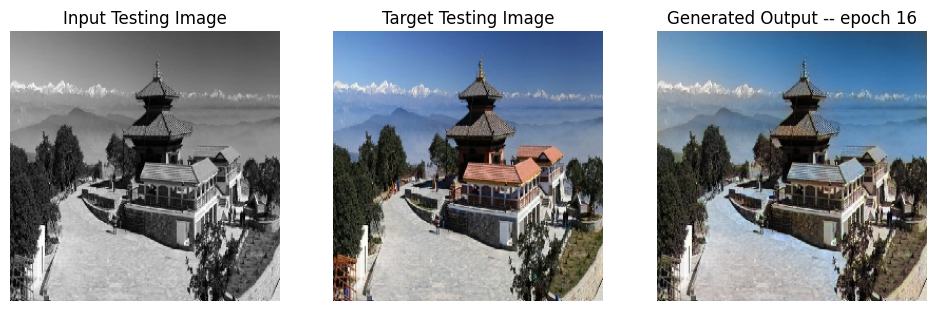

SSIM Score: 0.9699068069458008
PSNR Score: 26.057735443115234
Epoch 16
Training Details
Generator-- total_loss:18.35788 gan_loss:12.43012 l1_loss:0.03573 perceptual_loss:0.00662 Discriminator-- total_loss:0.00007 real_loss:0.00003 generated_loss:0.00003 --- SSIM 0.94842 PSNR 23.98051 LPIPS 0.00000
Time taken for epoch 17 is 429.6314947605133 sec
Number of iteration 525
Validation Details
Generator-- total_loss:8.00315 gan_loss:1.32856 l1_loss:0.03900  perceptual_loss:0.00867 Discriminator-- total_loss:1.28143 real_loss:0.69166 generated_loss:0.58977 --- SSIM 0.94792 PSNR 24.27081 LPIPS 0.00000
Time taken for epoch 17 is 477.0465655326843 sec
Number of iteration 70
Epoch 17
Training Details
Generator-- total_loss:19.39913 gan_loss:13.43728 l1_loss:0.03595 perceptual_loss:0.00663 Discriminator-- total_loss:0.00003 real_loss:0.00002 generated_loss:0.00001 --- SSIM 0.94821 PSNR 23.96766 LPIPS 0.00000
Time taken for epoch 18 is 434.247962474823 sec
Number of iteration 525
Validation Details

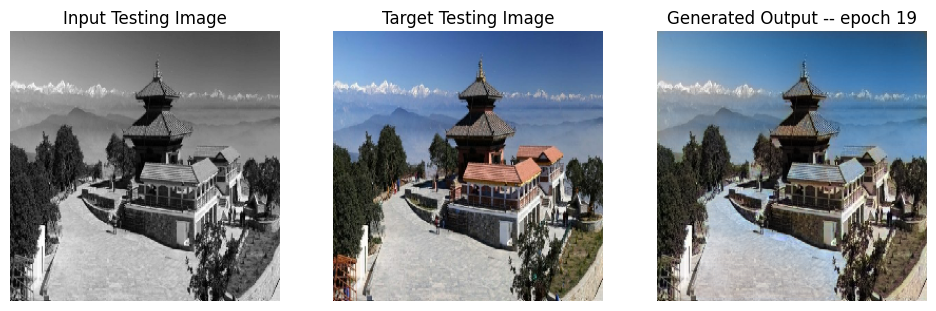

SSIM Score: 0.9694958329200745
PSNR Score: 25.98479652404785
Epoch 19
Training Details
Generator-- total_loss:22.43638 gan_loss:16.48993 l1_loss:0.03584 perceptual_loss:0.00664 Discriminator-- total_loss:0.03942 real_loss:0.01364 generated_loss:0.02577 --- SSIM 0.94839 PSNR 23.96044 LPIPS 0.00000
Time taken for epoch 20 is 430.38661789894104 sec
Number of iteration 525
Validation Details
Generator-- total_loss:6.74461 gan_loss:0.02499 l1_loss:0.03928  perceptual_loss:0.00872 Discriminator-- total_loss:10.62901 real_loss:10.53622 generated_loss:0.09279 --- SSIM 0.94773 PSNR 24.24028 LPIPS 0.00000
Time taken for epoch 20 is 476.80118918418884 sec
Number of iteration 70
Epoch 20
Training Details
Generator-- total_loss:18.98890 gan_loss:13.07026 l1_loss:0.03566 perceptual_loss:0.00662 Discriminator-- total_loss:0.00017 real_loss:0.00016 generated_loss:0.00001 --- SSIM 0.94857 PSNR 23.99673 LPIPS 0.00000
Time taken for epoch 21 is 426.84773874282837 sec
Number of iteration 525
Validation De

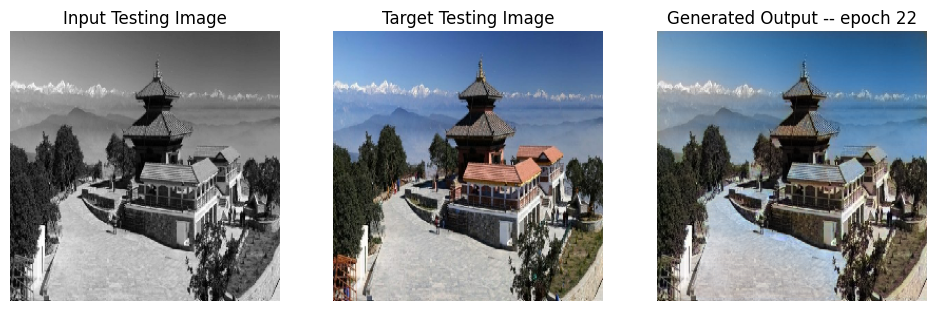

SSIM Score: 0.9695560336112976
PSNR Score: 25.984407424926758
Epoch 22
Training Details
Generator-- total_loss:20.53445 gan_loss:14.61249 l1_loss:0.03570 perceptual_loss:0.00660 Discriminator-- total_loss:0.00004 real_loss:0.00003 generated_loss:0.00001 --- SSIM 0.94843 PSNR 23.98107 LPIPS 0.00000
Time taken for epoch 23 is 428.75653052330017 sec
Number of iteration 525
Validation Details
Generator-- total_loss:6.93949 gan_loss:0.21521 l1_loss:0.03925  perceptual_loss:0.00878 Discriminator-- total_loss:7.31008 real_loss:6.93991 generated_loss:0.37018 --- SSIM 0.94759 PSNR 24.21904 LPIPS 0.00000
Time taken for epoch 23 is 474.9614112377167 sec
Number of iteration 70
Epoch 23
Training Details
Generator-- total_loss:21.13332 gan_loss:15.19970 l1_loss:0.03574 perceptual_loss:0.00664 Discriminator-- total_loss:0.00002 real_loss:0.00001 generated_loss:0.00001 --- SSIM 0.94825 PSNR 24.01099 LPIPS 0.00000
Time taken for epoch 24 is 430.53728890419006 sec
Number of iteration 525
Validation Deta

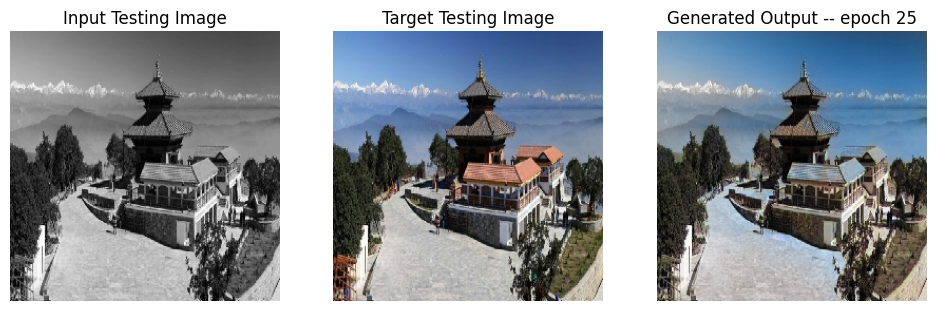

SSIM Score: 0.969876229763031
PSNR Score: 26.037473678588867
Epoch 25
Training Details
Generator-- total_loss:38.04176 gan_loss:32.10538 l1_loss:0.03577 perceptual_loss:0.00664 Discriminator-- total_loss:0.32599 real_loss:0.32599 generated_loss:0.00000 --- SSIM 0.94840 PSNR 23.99604 LPIPS 0.00000
Time taken for epoch 26 is 428.6743862628937 sec
Number of iteration 525
Validation Details
Generator-- total_loss:27.73094 gan_loss:21.04697 l1_loss:0.03905  perceptual_loss:0.00869 Discriminator-- total_loss:13.29133 real_loss:0.06735 generated_loss:13.22398 --- SSIM 0.94787 PSNR 24.26381 LPIPS 0.00000
Time taken for epoch 26 is 475.4514706134796 sec
Number of iteration 70
Epoch 26
Training Details
Generator-- total_loss:19.99816 gan_loss:14.05322 l1_loss:0.03586 perceptual_loss:0.00661 Discriminator-- total_loss:0.06730 real_loss:0.02344 generated_loss:0.04386 --- SSIM 0.94809 PSNR 23.96131 LPIPS 0.00000
Time taken for epoch 27 is 430.19033455848694 sec
Number of iteration 525
Validation De

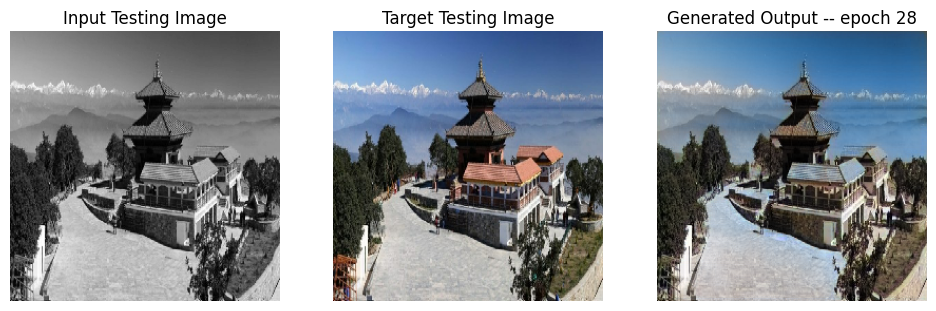

SSIM Score: 0.9696669578552246
PSNR Score: 26.0003604888916
Epoch 28
Training Details
Generator-- total_loss:18.50680 gan_loss:12.55629 l1_loss:0.03586 perceptual_loss:0.00664 Discriminator-- total_loss:0.04707 real_loss:0.01588 generated_loss:0.03119 --- SSIM 0.94848 PSNR 23.95341 LPIPS 0.00000
Time taken for epoch 29 is 429.7222697734833 sec
Number of iteration 525
Validation Details
Generator-- total_loss:6.81727 gan_loss:0.15657 l1_loss:0.03890  perceptual_loss:0.00868 Discriminator-- total_loss:4.46221 real_loss:4.27851 generated_loss:0.18370 --- SSIM 0.94802 PSNR 24.28757 LPIPS 0.00000
Time taken for epoch 29 is 475.3293561935425 sec
Number of iteration 70
Epoch 29
Training Details
Generator-- total_loss:21.48243 gan_loss:15.52579 l1_loss:0.03596 perceptual_loss:0.00659 Discriminator-- total_loss:0.00532 real_loss:0.00397 generated_loss:0.00135 --- SSIM 0.94754 PSNR 23.98173 LPIPS 0.00000
Time taken for epoch 30 is 429.97021293640137 sec
Number of iteration 525
Validation Details

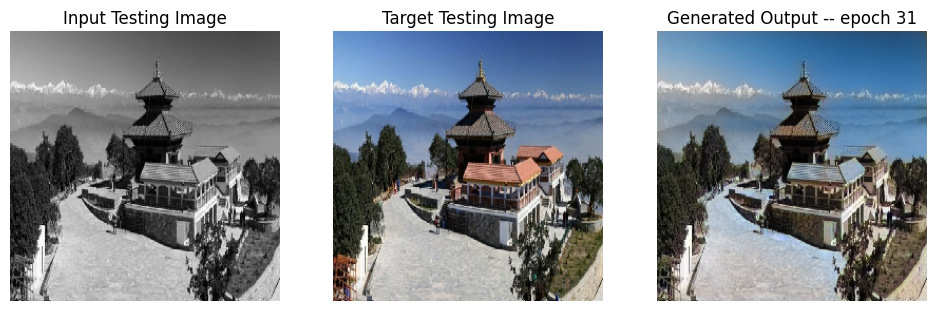

SSIM Score: 0.9697942733764648
PSNR Score: 26.02682876586914
Epoch 31
Training Details
Generator-- total_loss:18.64813 gan_loss:12.70822 l1_loss:0.03582 perceptual_loss:0.00661 Discriminator-- total_loss:0.02801 real_loss:0.01138 generated_loss:0.01663 --- SSIM 0.94833 PSNR 23.95125 LPIPS 0.00000
Time taken for epoch 32 is 431.8315942287445 sec
Number of iteration 525
Validation Details
Generator-- total_loss:7.34257 gan_loss:0.63846 l1_loss:0.03917  perceptual_loss:0.00871 Discriminator-- total_loss:2.87237 real_loss:2.41512 generated_loss:0.45725 --- SSIM 0.94778 PSNR 24.25362 LPIPS 0.00000
Time taken for epoch 32 is 477.8218791484833 sec
Number of iteration 70
Epoch 32
Training Details
Generator-- total_loss:20.20390 gan_loss:14.27333 l1_loss:0.03576 perceptual_loss:0.00660 Discriminator-- total_loss:0.00003 real_loss:0.00003 generated_loss:0.00000 --- SSIM 0.94877 PSNR 23.99942 LPIPS 0.00000
Time taken for epoch 33 is 428.2741467952728 sec
Number of iteration 525
Validation Details

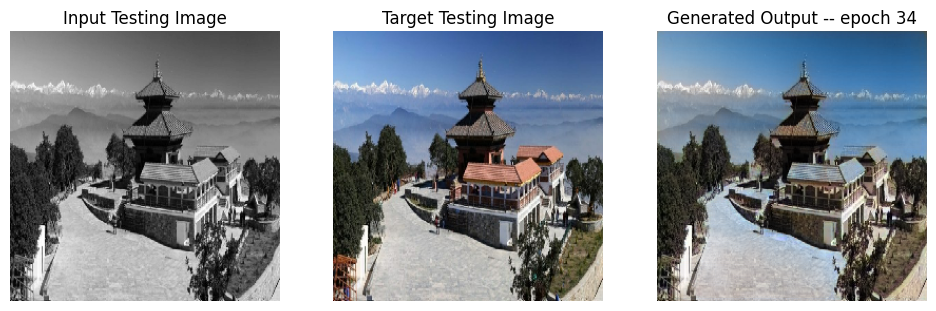

SSIM Score: 0.9696383476257324
PSNR Score: 26.01676368713379
Epoch 34
Training Details
Generator-- total_loss:29.36662 gan_loss:23.38948 l1_loss:0.03604 perceptual_loss:0.00665 Discriminator-- total_loss:0.00024 real_loss:0.00006 generated_loss:0.00018 --- SSIM 0.94796 PSNR 23.95289 LPIPS 0.00000
Time taken for epoch 35 is 427.5063810348511 sec
Number of iteration 525
Validation Details
Generator-- total_loss:7.52220 gan_loss:0.83365 l1_loss:0.03907  perceptual_loss:0.00871 Discriminator-- total_loss:4.84396 real_loss:3.59057 generated_loss:1.25339 --- SSIM 0.94767 PSNR 24.26529 LPIPS 0.00000
Time taken for epoch 35 is 473.9813480377197 sec
Number of iteration 70
Epoch 35
Training Details
Generator-- total_loss:27.61851 gan_loss:21.64500 l1_loss:0.03606 perceptual_loss:0.00661 Discriminator-- total_loss:0.00003 real_loss:0.00002 generated_loss:0.00001 --- SSIM 0.94788 PSNR 23.96763 LPIPS 0.00000
Time taken for epoch 36 is 427.5647656917572 sec
Number of iteration 525
Validation Details

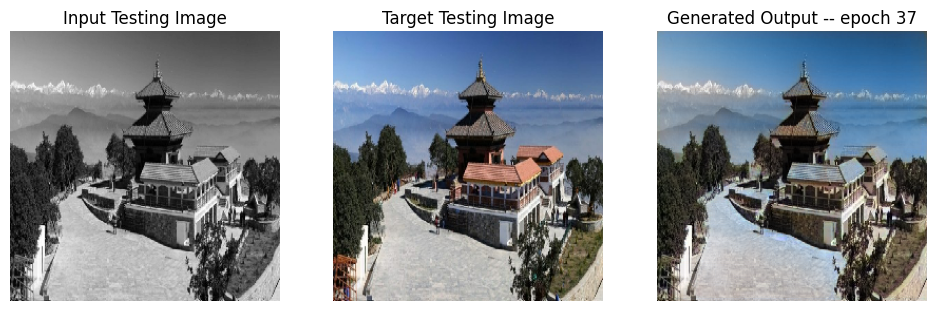

SSIM Score: 0.9696603417396545
PSNR Score: 26.008878707885742
Epoch 37
Training Details
Generator-- total_loss:27.72825 gan_loss:21.74705 l1_loss:0.03608 perceptual_loss:0.00664 Discriminator-- total_loss:0.00000 real_loss:0.00000 generated_loss:0.00000 --- SSIM 0.94825 PSNR 23.91946 LPIPS 0.00000
Time taken for epoch 38 is 431.5023889541626 sec
Number of iteration 525
Validation Details
Generator-- total_loss:7.25315 gan_loss:0.58541 l1_loss:0.03893  perceptual_loss:0.00870 Discriminator-- total_loss:4.94233 real_loss:4.02255 generated_loss:0.91978 --- SSIM 0.94807 PSNR 24.29893 LPIPS 0.00000
Time taken for epoch 38 is 477.90297842025757 sec
Number of iteration 70
Epoch 38
Training Details
Generator-- total_loss:34.72842 gan_loss:28.76313 l1_loss:0.03598 perceptual_loss:0.00663 Discriminator-- total_loss:0.07168 real_loss:0.05370 generated_loss:0.01798 --- SSIM 0.94812 PSNR 23.94734 LPIPS 0.00000
Time taken for epoch 39 is 427.58443427085876 sec
Number of iteration 525
Validation Deta

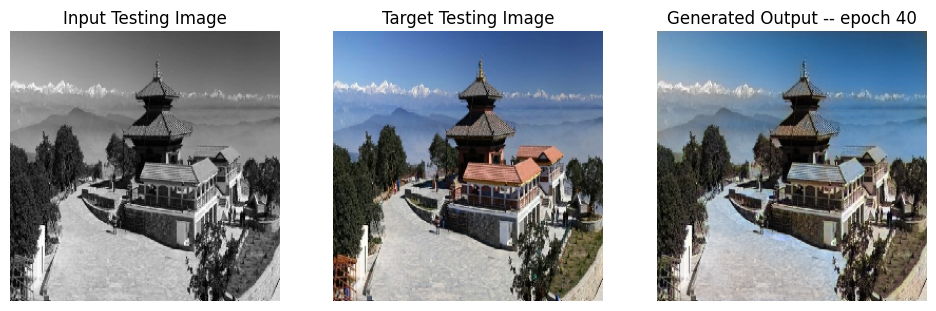

SSIM Score: 0.9697203636169434
PSNR Score: 26.042865753173828
Epoch 40
Training Details
Generator-- total_loss:36.83685 gan_loss:30.90944 l1_loss:0.03577 perceptual_loss:0.00657 Discriminator-- total_loss:0.00121 real_loss:0.00031 generated_loss:0.00090 --- SSIM 0.94819 PSNR 24.00243 LPIPS 0.00000
Time taken for epoch 41 is 427.65473556518555 sec
Number of iteration 525
Validation Details
Generator-- total_loss:6.93130 gan_loss:0.20939 l1_loss:0.03930  perceptual_loss:0.00871 Discriminator-- total_loss:15.39716 real_loss:14.49696 generated_loss:0.90020 --- SSIM 0.94758 PSNR 24.21326 LPIPS 0.00000
Time taken for epoch 41 is 473.08753633499146 sec
Number of iteration 70
Epoch 41
Training Details
Generator-- total_loss:38.03414 gan_loss:32.08392 l1_loss:0.03588 perceptual_loss:0.00662 Discriminator-- total_loss:0.00013 real_loss:0.00000 generated_loss:0.00013 --- SSIM 0.94824 PSNR 23.97798 LPIPS 0.00000
Time taken for epoch 42 is 427.6010088920593 sec
Number of iteration 525
Validation De

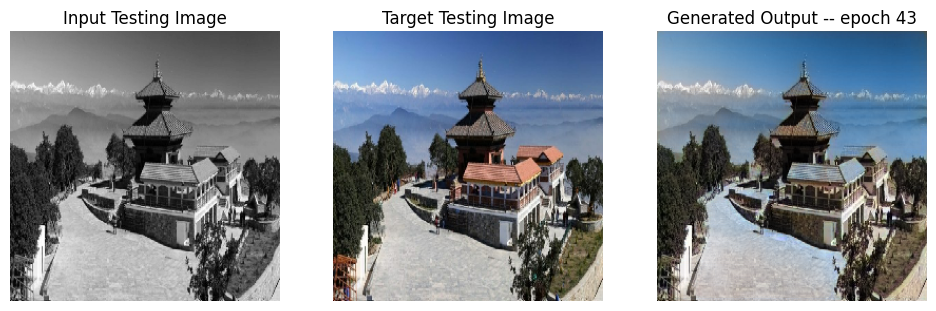

SSIM Score: 0.9696251749992371
PSNR Score: 26.02960777282715
Epoch 43
Training Details
Generator-- total_loss:36.02322 gan_loss:30.07434 l1_loss:0.03586 perceptual_loss:0.00663 Discriminator-- total_loss:0.00027 real_loss:0.00009 generated_loss:0.00018 --- SSIM 0.94816 PSNR 23.95935 LPIPS 0.00000
Time taken for epoch 44 is 429.05539321899414 sec
Number of iteration 525
Validation Details
Generator-- total_loss:6.95427 gan_loss:0.25915 l1_loss:0.03913  perceptual_loss:0.00869 Discriminator-- total_loss:15.47157 real_loss:14.87356 generated_loss:0.59800 --- SSIM 0.94754 PSNR 24.27118 LPIPS 0.00000
Time taken for epoch 44 is 474.7715744972229 sec
Number of iteration 70
Epoch 44
Training Details
Generator-- total_loss:34.95000 gan_loss:29.02656 l1_loss:0.03574 perceptual_loss:0.00657 Discriminator-- total_loss:0.00010 real_loss:0.00008 generated_loss:0.00002 --- SSIM 0.94833 PSNR 24.02516 LPIPS 0.00000
Time taken for epoch 45 is 426.7300155162811 sec
Number of iteration 525
Validation Deta

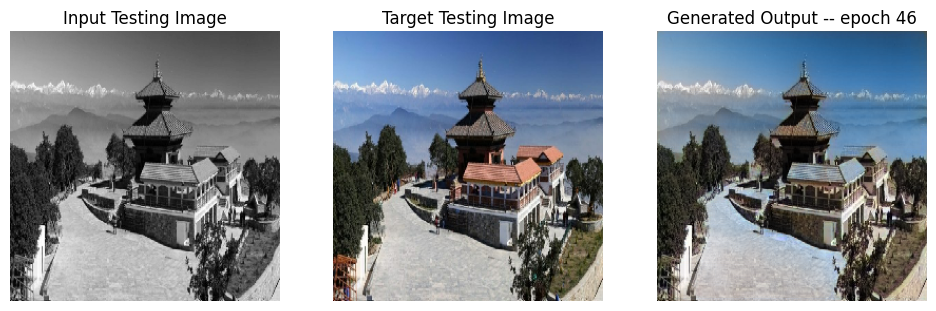

SSIM Score: 0.9699051976203918
PSNR Score: 26.043100357055664
Reduced generator learning rate to 0.0004500000213738531 at epoch 46
Epoch 46
Training Details
Generator-- total_loss:5.31863 gan_loss:0.10100 l1_loss:0.03197 perceptual_loss:0.00530 Discriminator-- total_loss:97.50344 real_loss:97.50344 generated_loss:0.00000 --- SSIM 0.95649 PSNR 25.90303 LPIPS 0.00000
Time taken for epoch 47 is 571.1072788238525 sec
Number of iteration 525
Validation Details
Generator-- total_loss:6.26838 gan_loss:0.00000 l1_loss:0.03711  perceptual_loss:0.00766 Discriminator-- total_loss:74.29445 real_loss:74.29445 generated_loss:0.00000 --- SSIM 0.95079 PSNR 24.62301 LPIPS 0.00000
Time taken for epoch 47 is 617.5119442939758 sec
Number of iteration 70
Epoch 47
Training Details
Generator-- total_loss:5.11040 gan_loss:0.00000 l1_loss:0.03137 perceptual_loss:0.00513 Discriminator-- total_loss:96.33907 real_loss:96.33907 generated_loss:0.00000 --- SSIM 0.95775 PSNR 26.06304 LPIPS 0.00000
Time taken for epoc

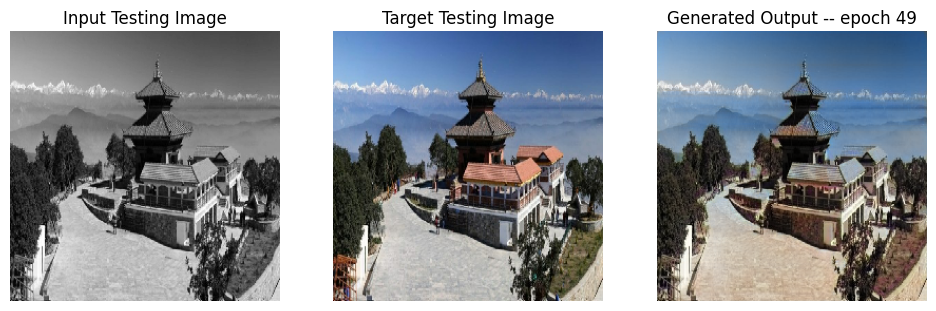

SSIM Score: 0.9710343480110168
PSNR Score: 26.608482360839844
Epoch 49
Training Details
Generator-- total_loss:5.09685 gan_loss:0.00000 l1_loss:0.03130 perceptual_loss:0.00511 Discriminator-- total_loss:94.39488 real_loss:94.39488 generated_loss:0.00000 --- SSIM 0.95790 PSNR 26.10445 LPIPS 0.00000
Time taken for epoch 50 is 571.3236618041992 sec
Number of iteration 525
Validation Details
Generator-- total_loss:6.20441 gan_loss:0.00000 l1_loss:0.03675  perceptual_loss:0.00756 Discriminator-- total_loss:66.42473 real_loss:66.42473 generated_loss:0.00000 --- SSIM 0.95161 PSNR 24.75518 LPIPS 0.00000
Time taken for epoch 50 is 617.0958216190338 sec
Number of iteration 70
Epoch 50
Training Details
Generator-- total_loss:5.12230 gan_loss:0.00000 l1_loss:0.03146 perceptual_loss:0.00513 Discriminator-- total_loss:94.11759 real_loss:94.11758 generated_loss:0.00001 --- SSIM 0.95771 PSNR 26.06746 LPIPS 0.00000
Time taken for epoch 51 is 571.2781581878662 sec
Number of iteration 525
Validation Deta

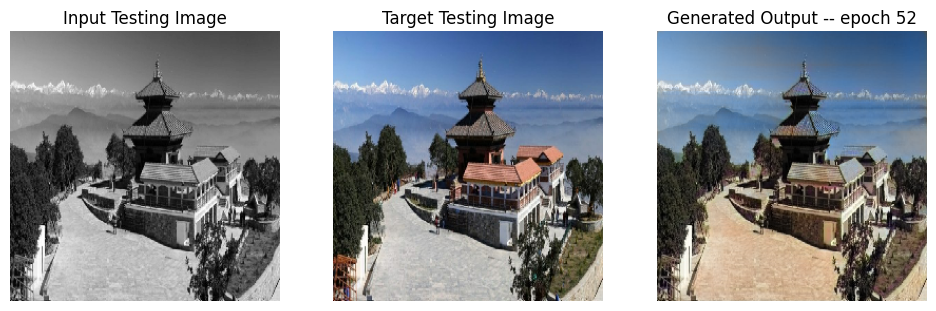

SSIM Score: 0.9684904217720032
PSNR Score: 25.33604621887207
Epoch 52
Training Details
Generator-- total_loss:5.06842 gan_loss:0.00000 l1_loss:0.03110 perceptual_loss:0.00510 Discriminator-- total_loss:93.77697 real_loss:93.77697 generated_loss:0.00000 --- SSIM 0.95837 PSNR 26.15197 LPIPS 0.00000
Time taken for epoch 53 is 570.2121531963348 sec
Number of iteration 525
Validation Details
Generator-- total_loss:7.76896 gan_loss:0.00000 l1_loss:0.04723  perceptual_loss:0.00827 Discriminator-- total_loss:59.19155 real_loss:59.19155 generated_loss:0.00000 --- SSIM 0.94708 PSNR 22.86105 LPIPS 0.00000
Time taken for epoch 53 is 615.9227936267853 sec
Number of iteration 70
Epoch 53
Training Details
Generator-- total_loss:5.06919 gan_loss:0.00000 l1_loss:0.03111 perceptual_loss:0.00510 Discriminator-- total_loss:93.70787 real_loss:93.70787 generated_loss:0.00000 --- SSIM 0.95805 PSNR 26.14226 LPIPS 0.00000
Time taken for epoch 54 is 571.3349649906158 sec
Number of iteration 525
Validation Detai

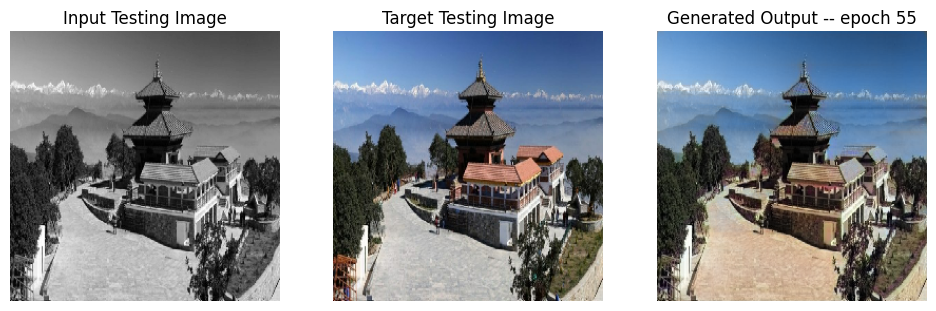

SSIM Score: 0.9719927906990051
PSNR Score: 26.284805297851562
Epoch 55
Training Details
Generator-- total_loss:5.05586 gan_loss:0.00000 l1_loss:0.03101 perceptual_loss:0.00510 Discriminator-- total_loss:92.65507 real_loss:92.65506 generated_loss:0.00001 --- SSIM 0.95850 PSNR 26.17170 LPIPS 0.00000
Time taken for epoch 56 is 571.4117047786713 sec
Number of iteration 525
Validation Details
Generator-- total_loss:6.83391 gan_loss:0.00000 l1_loss:0.04039  perceptual_loss:0.00842 Discriminator-- total_loss:60.62727 real_loss:60.62727 generated_loss:0.00000 --- SSIM 0.95054 PSNR 24.14115 LPIPS 0.00000
Time taken for epoch 56 is 617.3519043922424 sec
Number of iteration 70
Epoch 56
Training Details
Generator-- total_loss:5.04575 gan_loss:0.00000 l1_loss:0.03101 perceptual_loss:0.00503 Discriminator-- total_loss:92.85783 real_loss:92.85783 generated_loss:0.00000 --- SSIM 0.95843 PSNR 26.17276 LPIPS 0.00000
Time taken for epoch 57 is 573.2037899494171 sec
Number of iteration 525
Validation Deta

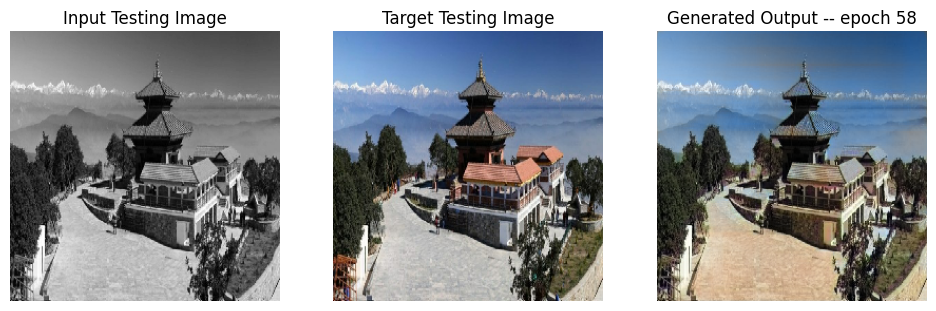

SSIM Score: 0.967363178730011
PSNR Score: 25.645166397094727
Reduced discriminator learning rate to 0.0003000000142492354 at epoch 58.
Epoch 58
Training Details
Generator-- total_loss:14.05834 gan_loss:8.99168 l1_loss:0.03110 perceptual_loss:0.00509 Discriminator-- total_loss:0.64117 real_loss:0.44582 generated_loss:0.19535 --- SSIM 0.95769 PSNR 26.12111 LPIPS 0.00000
Time taken for epoch 59 is 429.6790602207184 sec
Number of iteration 525
Validation Details
Generator-- total_loss:6.12744 gan_loss:0.02348 l1_loss:0.03621  perceptual_loss:0.00739 Discriminator-- total_loss:7.81954 real_loss:7.78038 generated_loss:0.03916 --- SSIM 0.95123 PSNR 24.76831 LPIPS 0.00000
Time taken for epoch 59 is 475.585081577301 sec
Number of iteration 70
Epoch 59
Training Details
Generator-- total_loss:16.48030 gan_loss:11.44997 l1_loss:0.03087 perceptual_loss:0.00506 Discriminator-- total_loss:0.09660 real_loss:0.04951 generated_loss:0.04709 --- SSIM 0.95811 PSNR 26.15432 LPIPS 0.00000
Time taken for epoc

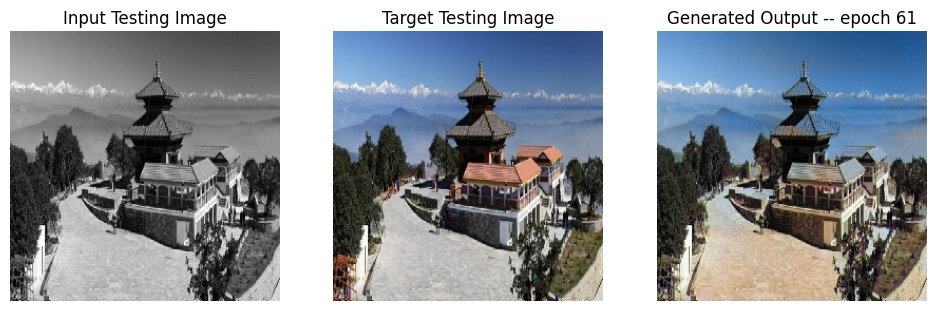

SSIM Score: 0.9690327048301697
PSNR Score: 25.877851486206055
Epoch 61
Training Details
Generator-- total_loss:17.47747 gan_loss:12.40532 l1_loss:0.03114 perceptual_loss:0.00509 Discriminator-- total_loss:0.06125 real_loss:0.02767 generated_loss:0.03359 --- SSIM 0.95777 PSNR 26.11273 LPIPS 0.00000
Time taken for epoch 62 is 429.2573003768921 sec
Number of iteration 525
Validation Details
Generator-- total_loss:6.11758 gan_loss:0.02315 l1_loss:0.03617  perceptual_loss:0.00736 Discriminator-- total_loss:5.50606 real_loss:5.42391 generated_loss:0.08215 --- SSIM 0.95126 PSNR 24.78388 LPIPS 0.00000
Time taken for epoch 62 is 474.50263476371765 sec
Number of iteration 70
Epoch 62
Training Details
Generator-- total_loss:18.71629 gan_loss:13.66889 l1_loss:0.03098 perceptual_loss:0.00508 Discriminator-- total_loss:0.03944 real_loss:0.01815 generated_loss:0.02129 --- SSIM 0.95790 PSNR 26.13510 LPIPS 0.00000
Time taken for epoch 63 is 428.09902930259705 sec
Number of iteration 525
Validation Deta

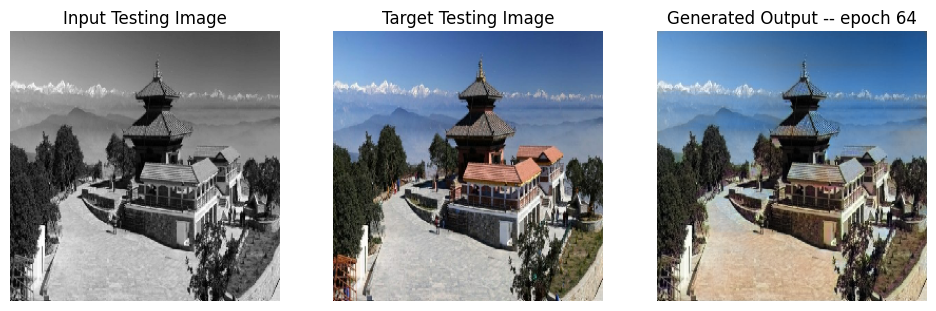

SSIM Score: 0.9690837860107422
PSNR Score: 25.815067291259766
Reduced generator learning rate to 0.0002025000096182339 at epoch 64
Epoch 64
Training Details
Generator-- total_loss:5.18268 gan_loss:0.03326 l1_loss:0.03163 perceptual_loss:0.00516 Discriminator-- total_loss:12.61438 real_loss:12.61332 generated_loss:0.00106 --- SSIM 0.95633 PSNR 25.87009 LPIPS 0.00000
Time taken for epoch 65 is 571.4958703517914 sec
Number of iteration 525
Validation Details
Generator-- total_loss:6.40466 gan_loss:0.00004 l1_loss:0.03809  perceptual_loss:0.00766 Discriminator-- total_loss:16.92400 real_loss:16.92379 generated_loss:0.00022 --- SSIM 0.94890 PSNR 24.18133 LPIPS 0.00000
Time taken for epoch 65 is 616.9818985462189 sec
Number of iteration 70
Epoch 65
Training Details
Generator-- total_loss:5.12456 gan_loss:0.01603 l1_loss:0.03131 perceptual_loss:0.00518 Discriminator-- total_loss:12.69499 real_loss:12.69297 generated_loss:0.00201 --- SSIM 0.95686 PSNR 25.96971 LPIPS 0.00000
Time taken for epoc

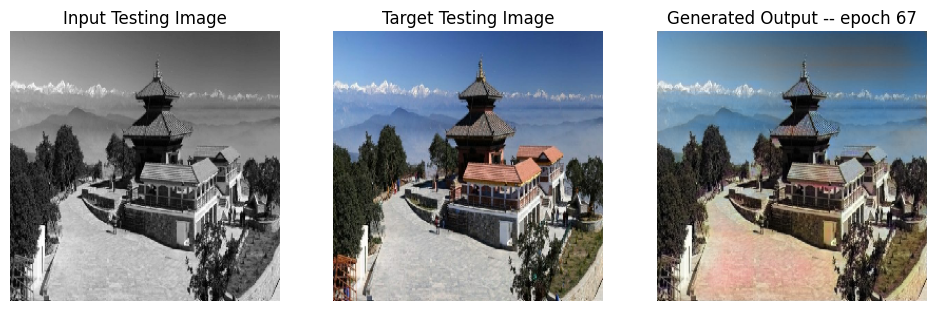

SSIM Score: 0.9638504981994629
PSNR Score: 24.516918182373047
Epoch 67
Training Details
Generator-- total_loss:5.07906 gan_loss:0.01041 l1_loss:0.03117 perceptual_loss:0.00503 Discriminator-- total_loss:11.79820 real_loss:11.79695 generated_loss:0.00125 --- SSIM 0.95734 PSNR 26.02390 LPIPS 0.00000
Time taken for epoch 68 is 570.3195493221283 sec
Number of iteration 525
Validation Details
Generator-- total_loss:6.37705 gan_loss:0.00002 l1_loss:0.03789  perceptual_loss:0.00766 Discriminator-- total_loss:15.74577 real_loss:15.74554 generated_loss:0.00023 --- SSIM 0.94879 PSNR 24.38823 LPIPS 0.00000
Time taken for epoch 68 is 616.3692321777344 sec
Number of iteration 70
Epoch 68
Training Details
Generator-- total_loss:5.08692 gan_loss:0.01233 l1_loss:0.03113 perceptual_loss:0.00512 Discriminator-- total_loss:12.53295 real_loss:12.53228 generated_loss:0.00067 --- SSIM 0.95728 PSNR 26.00242 LPIPS 0.00000
Time taken for epoch 69 is 569.320809841156 sec
Number of iteration 525
Validation Detai

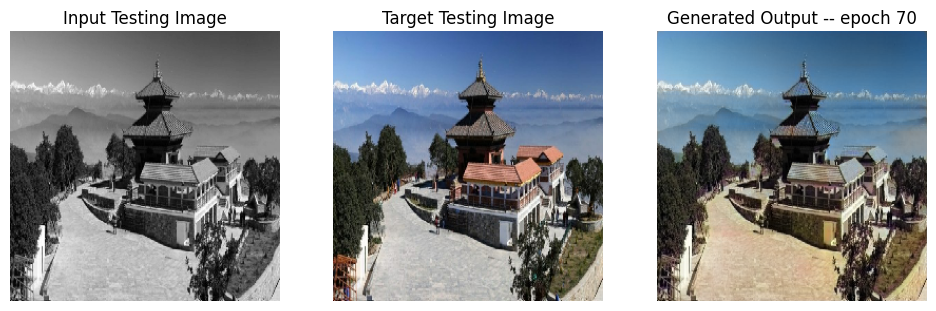

SSIM Score: 0.9715538024902344
PSNR Score: 25.63985824584961
Epoch 70
Training Details
Generator-- total_loss:5.05852 gan_loss:0.01019 l1_loss:0.03105 perceptual_loss:0.00501 Discriminator-- total_loss:12.15574 real_loss:12.15477 generated_loss:0.00096 --- SSIM 0.95751 PSNR 26.05791 LPIPS 0.00000
Time taken for epoch 71 is 571.9151556491852 sec
Number of iteration 525
Validation Details
Generator-- total_loss:6.17654 gan_loss:0.00004 l1_loss:0.03660  perceptual_loss:0.00752 Discriminator-- total_loss:16.24499 real_loss:16.24471 generated_loss:0.00028 --- SSIM 0.95077 PSNR 24.61688 LPIPS 0.00000
Time taken for epoch 71 is 617.4235672950745 sec
Number of iteration 70
Epoch 71
Training Details
Generator-- total_loss:5.05998 gan_loss:0.00906 l1_loss:0.03104 perceptual_loss:0.00504 Discriminator-- total_loss:11.57850 real_loss:11.57700 generated_loss:0.00150 --- SSIM 0.95745 PSNR 26.05009 LPIPS 0.00000
Time taken for epoch 72 is 572.6451549530029 sec
Number of iteration 525
Validation Detai

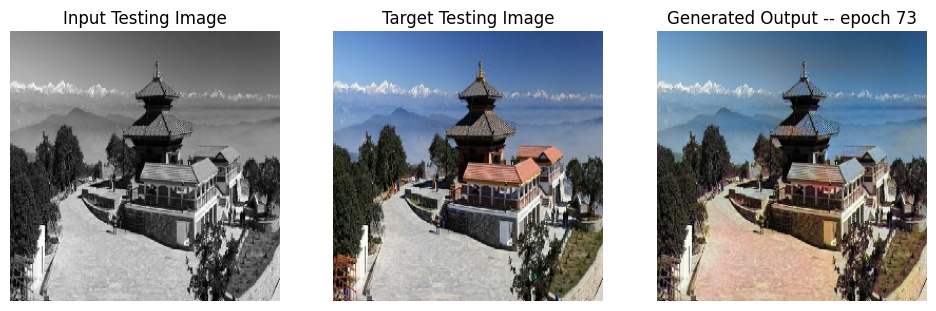

SSIM Score: 0.9679283499717712
PSNR Score: 24.995746612548828
Epoch 73
Training Details
Generator-- total_loss:9.50873 gan_loss:4.46877 l1_loss:0.03101 perceptual_loss:0.00499 Discriminator-- total_loss:0.37481 real_loss:0.15687 generated_loss:0.21794 --- SSIM 0.95787 PSNR 26.04513 LPIPS 0.00000
Time taken for epoch 74 is 427.7473156452179 sec
Number of iteration 525
Validation Details
Generator-- total_loss:6.68544 gan_loss:0.42010 l1_loss:0.03726  perceptual_loss:0.00749 Discriminator-- total_loss:1.93137 real_loss:1.47053 generated_loss:0.46084 --- SSIM 0.94960 PSNR 24.50212 LPIPS 0.00000
Time taken for epoch 74 is 474.47155380249023 sec
Number of iteration 70
Epoch 74
Training Details
Generator-- total_loss:9.89432 gan_loss:4.81944 l1_loss:0.03122 perceptual_loss:0.00503 Discriminator-- total_loss:0.23765 real_loss:0.09926 generated_loss:0.13839 --- SSIM 0.95749 PSNR 25.99493 LPIPS 0.00000
Time taken for epoch 75 is 427.0895845890045 sec
Number of iteration 525
Validation Details
G

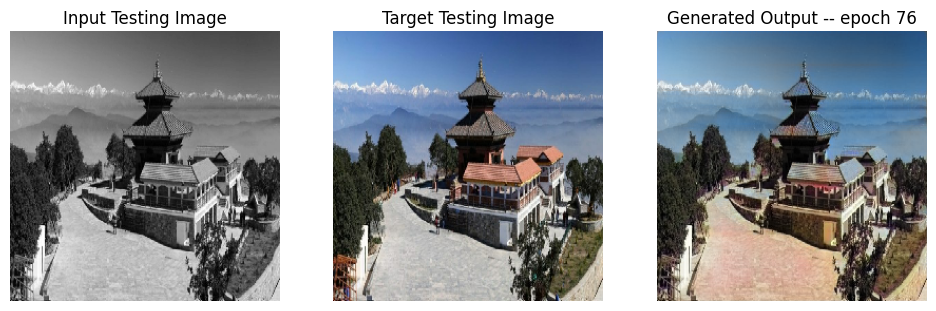

SSIM Score: 0.9680463671684265
PSNR Score: 25.039857864379883
Reduced generator learning rate to 9.11250062927138e-05 at epoch 76


In [50]:
fit(train_dataset, epochs, validation_dataset, gen)

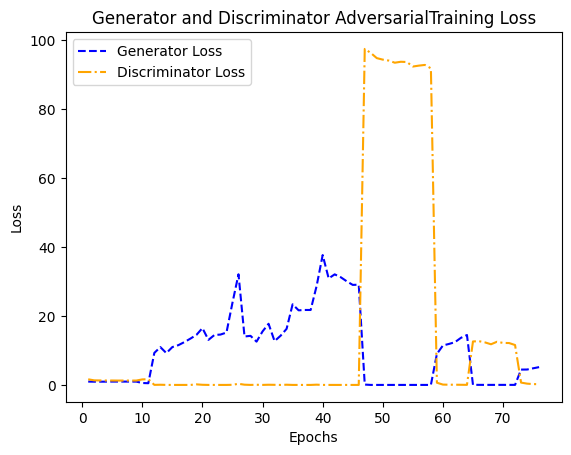

In [51]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_gan_losses, '--b', label='Generator Loss')
plt.plot(epochs, train_discriminator_losses, '-.', color='orange', label='Discriminator Loss')
plt.title('Generator and Discriminator AdversarialTraining Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/train_loss_plot_1.png')
plt.show()

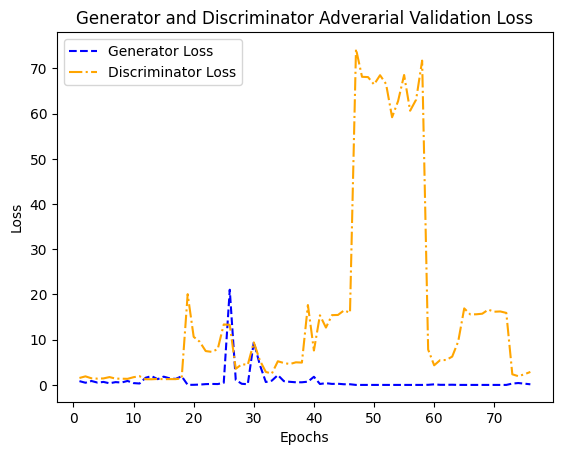

In [52]:
epochs = range(1, len(test_generator_losses) + 1)

plt.plot(epochs, test_generator_gan_losses, '--b', label='Generator Loss')
plt.plot(epochs, test_discriminator_losses, '-.', color='orange', label='Discriminator Loss')
plt.title('Generator and Discriminator Adverarial Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/test_loss_plot_1.png')
plt.show()

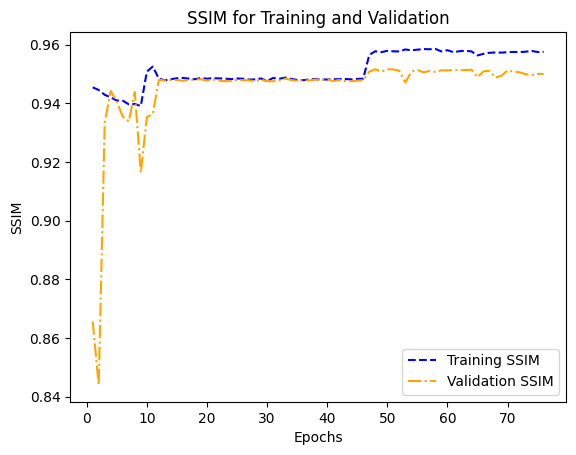

In [53]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_ssim, '--b', label='Training SSIM')
plt.plot(epochs, testing_ssim, '-.', color='orange', label='Validation SSIM')
plt.title('SSIM for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('SSIM')
plt.legend()
plt.savefig('/kaggle/working/SSIM_plot_1.png')
plt.show()

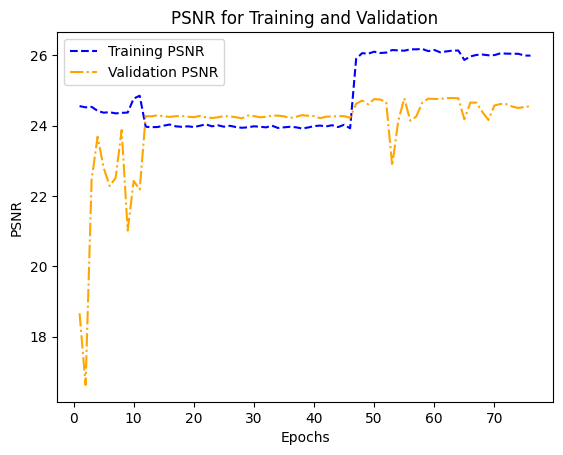

In [54]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_psnr, '--b', label='Training PSNR')
plt.plot(epochs, testing_psnr, '-.', color='orange', label='Validation PSNR')
plt.title('PSNR for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('PSNR')
plt.legend()
plt.savefig('/kaggle/working/PSNR_plot_1.png')
plt.show()

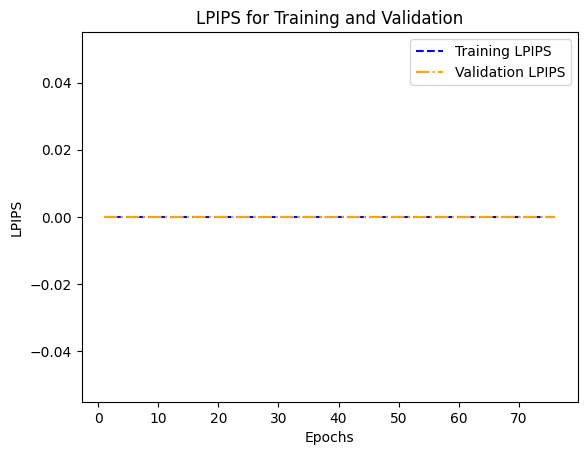

In [55]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_lpips, '--b', label='Training LPIPS')
plt.plot(epochs, testing_lpips, '-.', color='orange', label='Validation LPIPS')
plt.title('LPIPS for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('LPIPS')
plt.legend()
plt.savefig('/kaggle/working/LPIPS_plot_1.png')
plt.show()

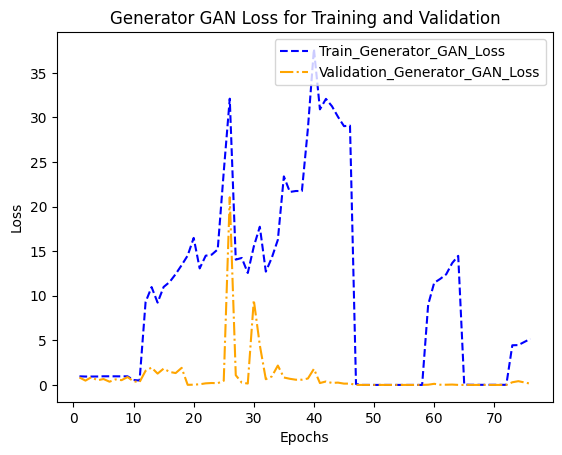

In [56]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_gan_losses, '--b', label='Train_Generator_GAN_Loss')
plt.plot(epochs, test_generator_gan_losses,'-.', color='orange', label='Validation_Generator_GAN_Loss')
plt.title('Generator GAN Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_GAN_plot_1.png')
plt.show()

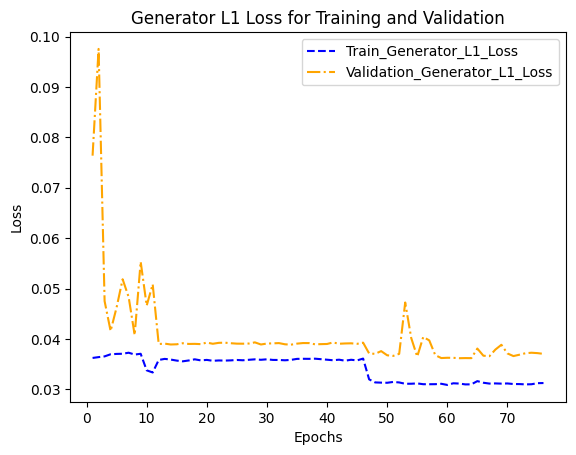

In [57]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_l1_losses, '--b', label='Train_Generator_L1_Loss')
plt.plot(epochs, test_generator_l1_losses, '-.', color='orange', label='Validation_Generator_L1_Loss')
plt.title('Generator L1 Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_L1_plot_1.png')
plt.show()

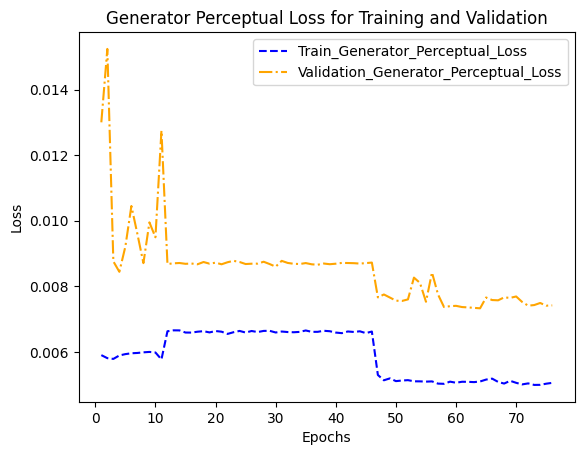

In [58]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_perceptual_losses, '--b', label='Train_Generator_Perceptual_Loss')
plt.plot(epochs, test_generator_perceptual_losses, '-.', color='orange', label='Validation_Generator_Perceptual_Loss')
plt.title('Generator Perceptual Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_Perceptual_plot_1.png')
plt.show()

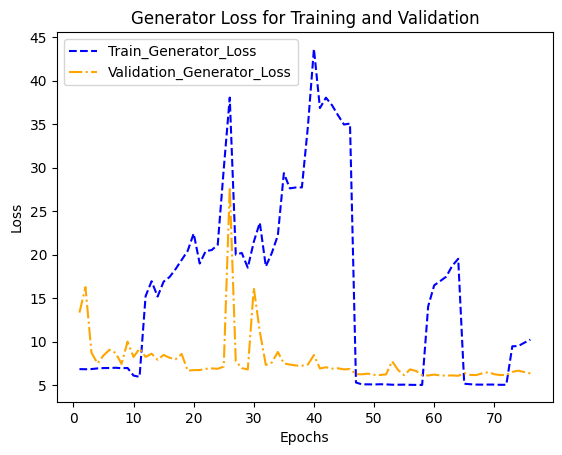

In [59]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_losses, '--b', label='Train_Generator_Loss')
plt.plot(epochs, test_generator_losses, '-.', color='orange', label='Validation_Generator_Loss')
plt.title('Generator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_plot_1.png')
plt.show()

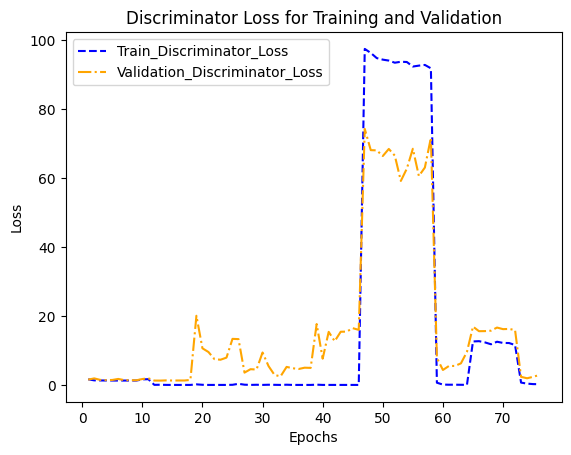

In [60]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_losses, '--b', label='Train_Discriminator_Loss')
plt.plot(epochs, test_discriminator_losses, '-.', color='orange', label='Validation_Discriminator_Loss')
plt.title('Discriminator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_plot_1.png')
plt.show()

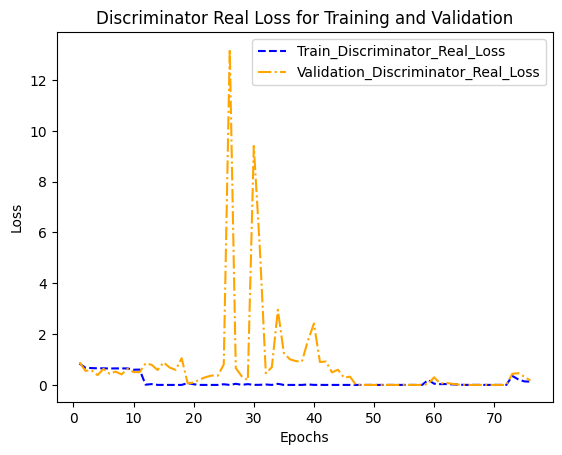

In [61]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_real_losses, '--b', label='Train_Discriminator_Real_Loss')
plt.plot(epochs, test_discriminator_real_losses, '-.', color='orange', label='Validation_Discriminator_Real_Loss')
plt.title('Discriminator Real Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Real_plot_1.png')
plt.show()

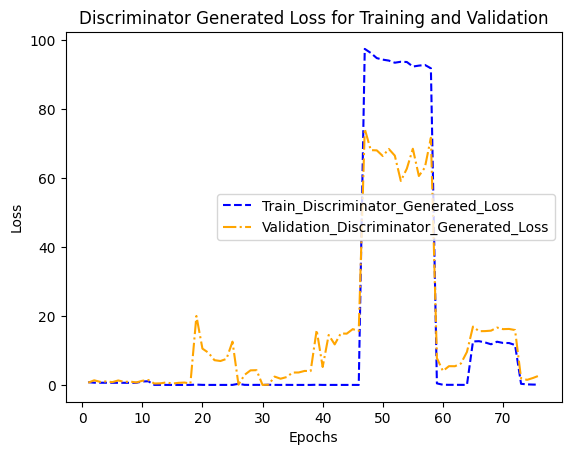

In [62]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_generated_losses, '--b', label='Train_Discriminator_Generated_Loss')
plt.plot(epochs, test_discriminator_generated_losses,'-.', color='orange', label='Validation_Discriminator_Generated_Loss')
plt.title('Discriminator Generated Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Generated_plot_1.png')
plt.show()

In [63]:
import csv
with open('/kaggle/working/dataJan20.csv','w', newline='') as file:
    writer = csv.writer(file)
    writer.writerows(all_records)

In [64]:
# # Evaluation on testing data


# each_epoch_test_lpips = []
# each_epoch_test_psnr = []
# each_epoch_test_ssim = []
# each_epoch_test_fid = []
# each_epoch_test_generator_losses = []
# each_epoch_test_generator_gan_losses = []
# each_epoch_test_generator_l1_losses = []
# each_epoch_test_generator_l2_losses = []
# each_epoch_test_generator_perceptual_losses = []
# each_epoch_test_discriminator_losses = []
# each_epoch_test_discriminator_real_losses = []
# each_epoch_test_discriminator_generated_losses = []

# for n, (input_, target) in test_dataset.enumerate():
#     test_gen_loss, test_gen_gan_loss, test_gen_l1_loss, test_gen_perceptual_loss, test_disc_loss, test_disc_real_loss, test_disc_generated_loss, test_ssim, test_psnr, test_lpips, test_fid = test_step(input_, target)

#     each_epoch_test_generator_losses.append(test_gen_loss)
#     each_epoch_test_generator_gan_losses.append(test_gen_gan_loss)
#     each_epoch_test_generator_l1_losses.append(test_gen_l1_loss)
# #             each_epoch_test_generator_l2_losses.append(test_gen_l2_loss)
#     each_epoch_test_generator_perceptual_losses.append(test_gen_perceptual_loss)
#     each_epoch_test_discriminator_losses.append(test_disc_loss)
#     each_epoch_test_discriminator_real_losses.append(test_disc_real_loss)
#     each_epoch_test_discriminator_generated_losses.append(test_disc_generated_loss)
#     each_epoch_test_ssim.append(tf.reduce_mean(test_ssim.numpy()))
#     each_epoch_test_psnr.append(tf.reduce_mean(test_psnr.numpy()))
#     each_epoch_test_lpips.append(tf.reduce_mean(test_lpips.numpy()))
#     each_epoch_test_fid.append(test_fid)
#     print(test_fid)

# print("Testing Details")
# print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f}  perceptual_loss:{:.5f} \nDiscriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- \nSSIM {:.5f} \nPSNR {:.5f} \nLPIPS {:.5f} \nFID Score: {:.5f}".format(np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses), np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr), np.mean(each_epoch_test_lpips), np.mean(each_epoch_test_fid)))

In [65]:
os.mkdir('/kaggle/working/modelsFeb27')

In [66]:
gen.save('/kaggle/working/modelsFeb27/gen.h5')
gen.save_weights('/kaggle/working/modelsFeb27/gen_weight.keras')
disc.save('/kaggle/working/modelsFeb27/disc.h5')
disc.save_weights('/kaggle/working/modelsFeb27/disc_weight.keras')

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [67]:
def download_file(path, download_file_name):
    os.chdir('/kaggle/working/')
    zip_name = f"/kaggle/working/{download_file_name}.zip"
    command = f"zip {zip_name} {path} -r"
    result = subprocess.run(command, shell=True, capture_output=True, text=True)
    if result.returncode !=0:
        print("Unable to run zip command")
        print(result.stderr)
        return
    display(FileLink(f'{download_file_name}.zip'))

In [68]:
import subprocess
from IPython.display import FileLink, display

In [69]:
download_file('/kaggle/working', 'outputFeb10')

/kaggle/working/outputFeb10.zip